# Main Pipeline for FieldMapper UNet End to End Learning on FTW Datasets and transfer to Lacuna Labels
This note book has two parts -- In the first part, the training pipeline was focused on preparing the FieldMapper UNet for an End to End Learning on the large-scale `Fields of the World` datasets 
splitted into training, validation, and testing sets. The second part was focused on taking the pretrained weights, trained on Fields of the World datasets and transfer it to the Lacuna Labels. 
##### The first part of this notebook was prepared by Rufai Omowunmi Balogun and the second part by Isaiah Taylor

## FieldMapper UNet End to End Learning on Fields of the World datasets

In [1]:
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2"
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2"

import torch
print(torch.cuda.device_count())

3


In [2]:
import time

import numpy as np
import torch
from torch.utils.data import DataLoader
from torchgeo.datamodules import BaseDataModule
from torchgeo.trainers import BaseTask
from torchgeo.transforms import AugmentationSequential
from torchmetrics import JaccardIndex, MetricCollection, Precision, Recall
from tqdm import tqdm

import kornia.augmentation as K

from src.ftw.datamodules import preprocess, FTWDataModule
from src.ftw.datasets import FTW
from src.ftw.metrics import get_object_level_metrics
from src.ftw.trainers import CustomSemanticSegmentationTask

In [3]:
if torch.cuda.is_available():
    device = torch.device(f"cuda")
else:
    device = torch.device("cpu")

In [4]:
print(f"Using device: {device}")

Using device: cuda


In [5]:
mean = torch.tensor([0, 0, 0, 0]) 
std = torch.tensor([3000, 3000, 3000, 3000])

train_aug = AugmentationSequential(
            K.Normalize(mean=mean, std=std),
            K.RandomRotation(p=0.5, degrees=90),
            K.RandomHorizontalFlip(p=0.5),
            K.RandomVerticalFlip(p=0.5),
            K.RandomSharpness(p=0.5),
            data_keys=["image", "mask"],
        )

aug = AugmentationSequential(
            K.Normalize(mean=mean, std=std), data_keys=["image", "mask"]
        )

In [7]:
countries = ["austria", "belgium", "brazil", "cambodia", "corsica", "croatia", "denmark", "estonia", "finland", 
            "france", "germany", "india", "kenya", "latvia", "lithuania", "luxembourg", "netherlands", "portugal", 
            "rwanda", "slovakia", "slovenia", "south_africa", "spain", "sweden", "vietnam"]

train_ds = FTW(
        root="/home/airg/rbalogun/ftwfieldmapper/data/ftw_data",
        countries=countries,
        split="train",
        transforms=train_aug,
        load_boundaries=True,
        temporal_options="windowB" , # "windowA", "windowB" , "median"
    )

val_ds = FTW(
        root="/home/airg/rbalogun/ftwfieldmapper/data/ftw_data",
        countries=countries,
        split="val",
        transforms=aug,
        load_boundaries=True,
        temporal_options="windowB" 
    )

test_ds = FTW(
        root="/home/airg/rbalogun/ftwfieldmapper/data/ftw_data",
        countries=countries,
        split="test",
        transforms=aug,
        load_boundaries=True,
        temporal_options="windowB" 
    )

Loading 3 Class Masks, with Boundaries
Temporal option:  windowB
Selecting :  55779  samples
Loading 3 Class Masks, with Boundaries
Temporal option:  windowB
Selecting :  6878  samples
Loading 3 Class Masks, with Boundaries
Temporal option:  windowB
Selecting :  7805  samples


In [21]:
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=12)
val_dl = DataLoader(val_ds, batch_size=64, shuffle=False, num_workers=12)
test_dl = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=12)

In [15]:
import yaml
import time
import torch

import numpy as np
import pandas as pd 
from torch.utils.data import DataLoader

configPath = "./src/configs/config_lacuna.yaml"

with open(configPath, "r") as config:
        params = yaml.safe_load(config)

# parameters
params_train = params['Train_Validate']
params_test = params['Test']

In [9]:
torch.cuda.device_count()

3

In [23]:
from src.lacuna.compiler import ModelCompiler
from src.lacuna.models import unet_att_d

model = ModelCompiler(
        model = eval(params_train['model'])( 
                4,
                params_train['channels'],
                **params_train['model_kwargs']
                ),
        working_dir=params_train["model_working_dir"],
        out_dir=params_train["model_out_dir"],
        buffer=params_train["buffer"],
        class_mapping=params_train["class_mapping"],
        gpu_devices=params_train.get("gpu_devices", [0]),
        use_sync_bn=params_train.get("use_sync_bn", False),
        model_init_type=params_train.get("model_init_type", "kaiming"),
        params_init= None, #params_train.get("params_init", None),
        freeze_params=eval(params_train.get("freeze_params", "None"))
    )

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.model.to(device)

# Wrap with DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    model = torch.nn.DataParallel(model)


--------- Vanilla Model compiled successfully ---------
----------GPU available----------
total number of trainable parameters: 157.9M
Using 3 GPUs


In [11]:

import csv, os, torch, numpy as np, pandas as pd
from tqdm import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau
from src.lacuna.evaluate import Evaluator          # <- original class

# ---------------------------------------------------------------------
# 1.  Wrappers
# ---------------------------------------------------------------------
def evaluate_dataloader(model, dataloader, num_classes, class_mapping,
                        device, buffer=None, out_name=None):
    """
    Runs the whole loader through `model` once and returns the metrics dict
    produced by Evaluator (overall acc, mIoU, etc.).
    """
    model.eval()
    evaluator = Evaluator(num_classes)

    with torch.no_grad():
        for imgs, labels in tqdm(dataloader, desc="Evaluating", leave=False):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            _, preds = torch.max(outputs.data, 1)

            if buffer:
                evaluator.add_batch(
                    labels[:, buffer:-buffer, buffer:-buffer].cpu().numpy(),
                    preds[:,  buffer:-buffer, buffer:-buffer].cpu().numpy()
                )
            else:
                evaluator.add_batch(labels.cpu().numpy(), preds.cpu().numpy())

    # Plot and/or save confusion matrix + csv, exactly as in your original fn
    if out_name:
        plot_name = out_name.rsplit(".", 1)[0] + ".png"
        evaluator.plot_confusion_matrix(class_mapping, plot_name)
        _dump_metrics_csv(evaluator, class_mapping, out_name)   # helper below
    else:
        evaluator.plot_confusion_matrix(class_mapping)

    # Collect the scalar metrics you care about
    metrics = {
        "Overall Accuracy":         evaluator.overall_accuracy(),
        "Mean Accuracy":            np.nanmean(evaluator.classwise_overall_accuracy()),
        "Mean IoU":                 np.nanmean(evaluator.intersection_over_union()),
        "Mean Precision":           np.nanmean(evaluator.precision()),
        "Mean Recall":              np.nanmean(evaluator.recall()),
        "Mean F1 Score":            np.nanmean(evaluator.f1_score())
    }
    return metrics


def _dump_metrics_csv(evaluator, class_mapping, out_name):
    """Helper for optional CSV export (kept identical to your code)."""
    class_acc     = evaluator.classwise_overall_accuracy()
    IoU           = evaluator.intersection_over_union()
    precision     = evaluator.precision()
    recall        = evaluator.recall()
    f1_score      = evaluator.f1_score()

    with open(out_name, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Metric", "Value"])
        writer.writerow(["Overall Accuracy", evaluator.overall_accuracy()])
        writer.writerow(["Mean Accuracy",   np.nanmean(class_acc)])
        writer.writerow(["Mean IoU",        np.nanmean(IoU)])
        writer.writerow(["Mean Precision",  np.nanmean(precision)])
        writer.writerow(["Mean Recall",     np.nanmean(recall)])
        writer.writerow(["Mean F1 Score",   np.nanmean(f1_score)])

    cls_file = out_name.rsplit(".", 1)[0] + "_classwise." + out_name.rsplit(".", 1)[1]
    with open(cls_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Class", "Accuracy", "IoU", "Precision", "Recall", "F1 Score"])
        for i in range(evaluator.num_class):
            cname = class_mapping[i]
            writer.writerow([cname, class_acc[i], IoU[i], precision[i], recall[i], f1_score[i]])

In [12]:
# ------------------------------------------------------------------
# run_segmentation_ftw.py   (only the function body changed)
# ------------------------------------------------------------------
# from src.lacuna.evaluate import evaluate          # <- this is the NEW helper
from src.lacuna.losses    import tversky_focal
import torch, os, yaml, pandas as pd
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm

# ftw_class_weights: [0.04,0.08,0.88]

class TupleWrapper(torch.utils.data.Dataset):
    def __init__(self, ds): self.ds = ds
    def __len__(self):      return len(self.ds)
    def __getitem__(self, i):
        s = self.ds[i]
        return s["image"].squeeze(0), s["mask"].long().squeeze(0)

# ---------------------------------------------------
def run_segmentation_ftw(config_path, model, train_dl, val_dl,
                         working_dir, out_dir):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model  = model.to(device)

    # ---------- load YAML ----------
    with open(config_path) as f:
        params       = yaml.safe_load(f)["Train_Validate"]
    n_cls           = params["n_classes"]
    class_mapping   = params["class_mapping"]
    buffer          = params.get("buffer", None)

    # ---------- evaluation loaders (images, mask) ----------
    train_dl_eval = torch.utils.data.DataLoader(
        TupleWrapper(train_dl.dataset),
        batch_size=params["train_batch"], shuffle=False, num_workers=12)

    val_dl_eval   = torch.utils.data.DataLoader(
        TupleWrapper(val_dl.dataset),
        batch_size=params["validate_batch"], shuffle=False, num_workers=12)

    # ---------- optimiser / scheduler / loss ----------
    criterion  = tversky_focal.LocallyWeightedTverskyFocalLoss(ignore_index=3)
    optimizer  = torch.optim.Adam(model.parameters(),
                                  lr=params["learning_rate_init"])
    scheduler  = ReduceLROnPlateau(optimizer, mode="min",
                                   patience=5, verbose=True)

    # ---------- bookkeeping ----------
    ckpt_dir   = os.path.join(working_dir, out_dir)
    os.makedirs(ckpt_dir, exist_ok=True)
    metrics_log = []
    best_miou = -1.0  # lowest possible starting point

    # ==========================================================
    for epoch in range(1, params["epoch"] + 1):
        # ---------------- training ----------------
        model.train()
        running_loss = 0.0

        for batch in tqdm(train_dl, desc=f"Epoch {epoch} ▸ training"):
            imgs  = batch["image"].to(device)
            if imgs.ndim == 5 and imgs.shape[1] == 1:
                imgs = imgs.squeeze(1)
            lbls  = batch["mask"].long().squeeze(1).to(device)

            optimizer.zero_grad()
            loss = criterion(model(imgs), lbls)

            if torch.isnan(loss):
                print("⚠️  NaN in loss – batch skipped")
                continue

            loss.backward();  optimizer.step()
            running_loss += loss.item()

        train_loss = running_loss / len(train_dl)

        # ---------------- evaluation ----------------
        print(f"Epoch {epoch} ▸ evaluating (train set)")
        train_metrics = evaluate_dataloader(
            model        = model,
            dataloader   = train_dl_eval,
            num_classes  = n_cls,
            class_mapping= class_mapping,
            device       = device,
            buffer       = buffer,
            out_name     = os.path.join(ckpt_dir,
                                        f"train_epoch{epoch}_metrics.csv"))

        print(f"Epoch {epoch} ▸ evaluating (val set)")
        val_metrics = evaluate_dataloader(
            model        = model,
            dataloader   = val_dl_eval,
            num_classes  = n_cls,
            class_mapping= class_mapping,
            device       = device,
            buffer       = buffer,
            out_name     = os.path.join(ckpt_dir,
                                        f"val_epoch{epoch}_metrics.csv"))

        scheduler.step(val_metrics["Mean IoU"])

        # -------- console summary --------
        print(f"Train Loss {train_loss:.4f} | "
              f"Train OA {train_metrics['Overall Accuracy']:.3f} | "
              f"Val OA {val_metrics['Overall Accuracy']:.3f} | "
              f"Val mIoU {val_metrics['Mean IoU']:.3f}")

        # -------- save best model (by mIoU) --------
        if val_metrics["Mean IoU"] > best_miou:
            best_miou = val_metrics["Mean IoU"]
            best_ckpt_path = os.path.join(ckpt_dir, "best_model_miou.pth")
            torch.save(model.module.state_dict() if isinstance(model, torch.nn.DataParallel)
                       else model.state_dict(), best_ckpt_path)
            print(f"✓ Saved new best model at epoch {epoch} with mIoU: {best_miou:.4f}")


        # -------- persist epoch metrics --------
        metrics_log.append({
            "Epoch":            epoch,
            "Train Loss":       train_loss,
            "Train OA":         train_metrics["Overall Accuracy"],
            "Train IoU":        train_metrics["Mean IoU"],
            "Train Precision":  train_metrics["Mean Precision"],
            "Train Recall":     train_metrics["Mean Recall"],
            "Train F1":         train_metrics["Mean F1 Score"],
            "Val OA":           val_metrics["Overall Accuracy"],
            "Val IoU":          val_metrics["Mean IoU"],
            "Val Precision":    val_metrics["Mean Precision"],
            "Val Recall":       val_metrics["Mean Recall"],
            "Val F1":           val_metrics["Mean F1 Score"],
        })

    # ========== final CSV ==========
    csv_path = os.path.join(ckpt_dir, "final_metrics_ftw.csv")
    pd.DataFrame(metrics_log).to_csv(csv_path, index=False)
    print(f"✓ training & validation metrics written → {csv_path}")


In [13]:
config_path = "/home/airg/rbalogun/ftwfieldmapper/src/configs/config_lacuna.yaml"
working_dir="/home/airg/rbalogun/ftwfieldmapper/model_work"
out_dir="ftw_exp_tversky_loss"

/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
Epoch 1 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old 

Epoch 1 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

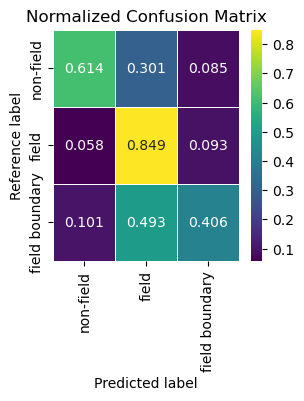

Epoch 1 ▸ evaluating (val set)


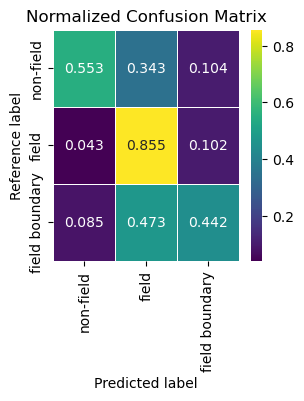

Train Loss 0.7807 | Train OA 0.678 | Val OA 0.645 | Val mIoU 0.376
✓ Saved new best model at epoch 1 with mIoU: 0.3759


Epoch 2 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 2 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

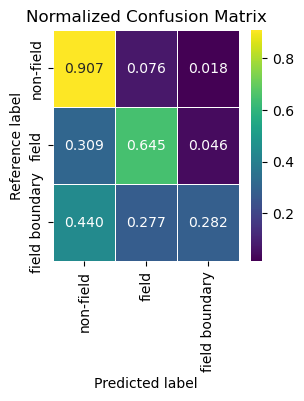

Epoch 2 ▸ evaluating (val set)


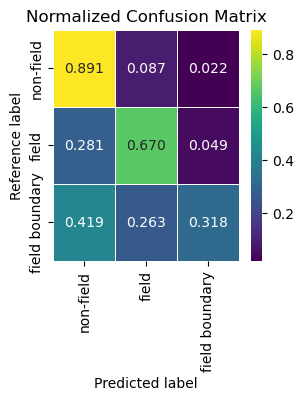

Train Loss 0.7250 | Train OA 0.811 | Val OA 0.804 | Val mIoU 0.495
✓ Saved new best model at epoch 2 with mIoU: 0.4953


Epoch 3 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 3 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

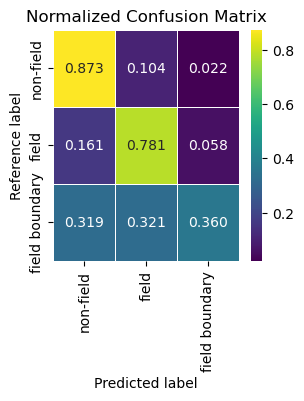

Epoch 3 ▸ evaluating (val set)


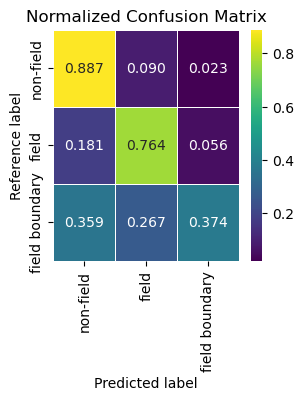

Train Loss 0.6904 | Train OA 0.831 | Val OA 0.833 | Val mIoU 0.537
✓ Saved new best model at epoch 3 with mIoU: 0.5373


Epoch 4 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 4 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

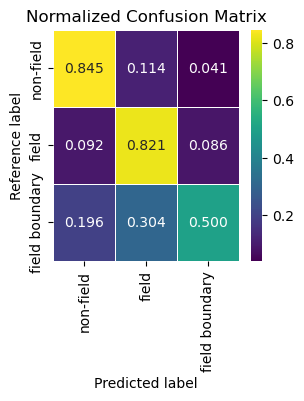

Epoch 4 ▸ evaluating (val set)


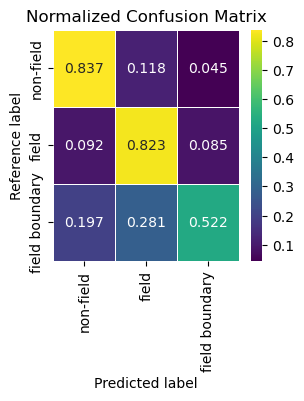

Train Loss 0.6731 | Train OA 0.828 | Val OA 0.823 | Val mIoU 0.541
✓ Saved new best model at epoch 4 with mIoU: 0.5407


Epoch 5 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 5 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

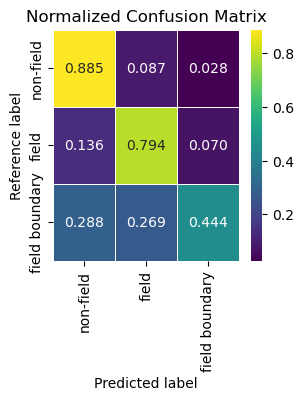

Epoch 5 ▸ evaluating (val set)


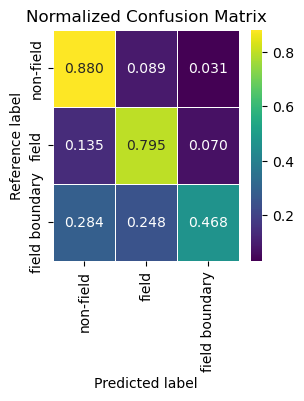

Train Loss 0.6613 | Train OA 0.845 | Val OA 0.841 | Val mIoU 0.556
✓ Saved new best model at epoch 5 with mIoU: 0.5556


Epoch 6 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 6 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

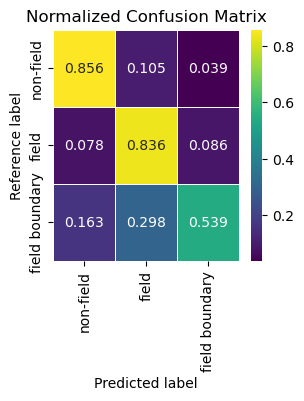

Epoch 6 ▸ evaluating (val set)


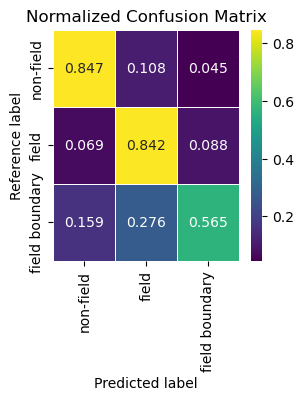

Train Loss 0.6529 | Train OA 0.841 | Val OA 0.837 | Val mIoU 0.560
✓ Saved new best model at epoch 6 with mIoU: 0.5600


Epoch 7 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 7 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

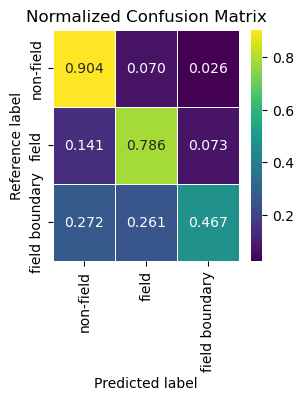

Epoch 7 ▸ evaluating (val set)


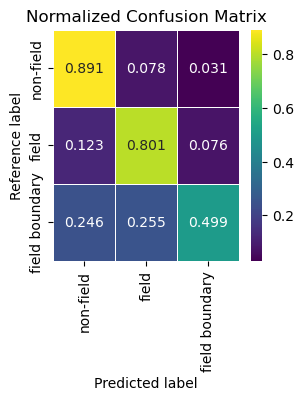

Train Loss 0.6455 | Train OA 0.856 | Val OA 0.851 | Val mIoU 0.569
✓ Saved new best model at epoch 7 with mIoU: 0.5690


Epoch 8 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 8 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

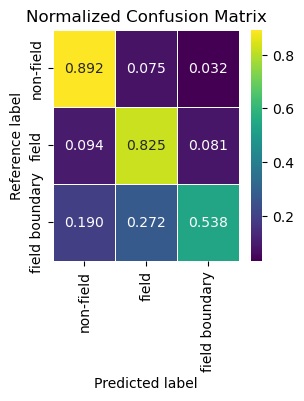

Epoch 8 ▸ evaluating (val set)


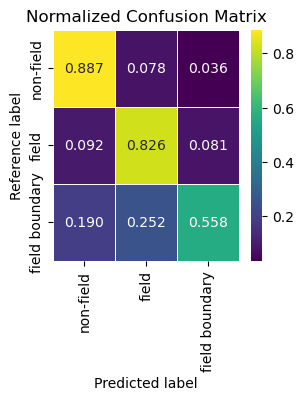

Train Loss 0.6315 | Train OA 0.862 | Val OA 0.858 | Val mIoU 0.583
✓ Saved new best model at epoch 8 with mIoU: 0.5831


Epoch 9 ▸ training:   0%|                                           | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 9 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

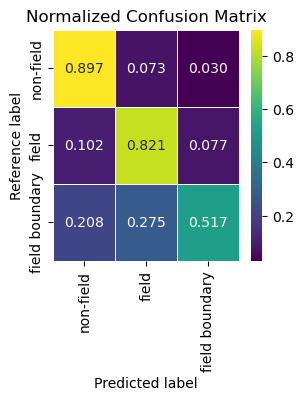

Epoch 9 ▸ evaluating (val set)


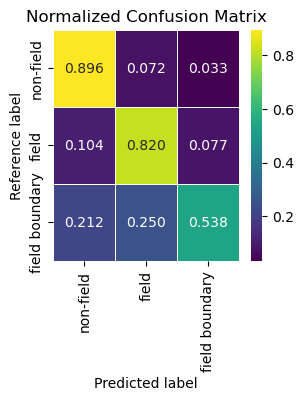

Train Loss 0.6278 | Train OA 0.864 | Val OA 0.861 | Val mIoU 0.585
✓ Saved new best model at epoch 9 with mIoU: 0.5851


Epoch 10 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 10 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

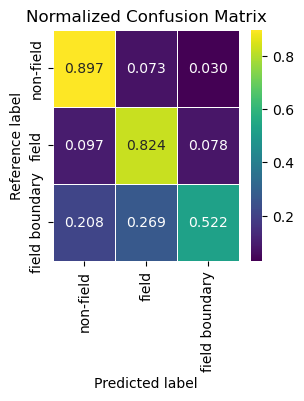

Epoch 10 ▸ evaluating (val set)


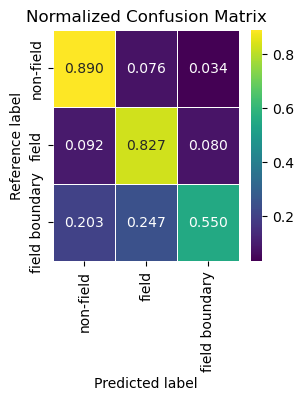

Train Loss 0.6261 | Train OA 0.865 | Val OA 0.861 | Val mIoU 0.586
✓ Saved new best model at epoch 10 with mIoU: 0.5857


Epoch 11 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 11 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

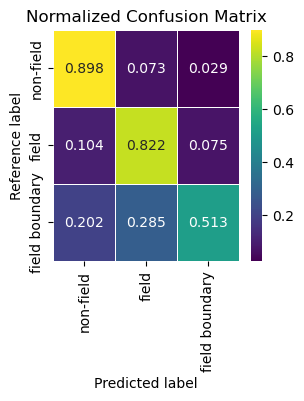

Epoch 11 ▸ evaluating (val set)


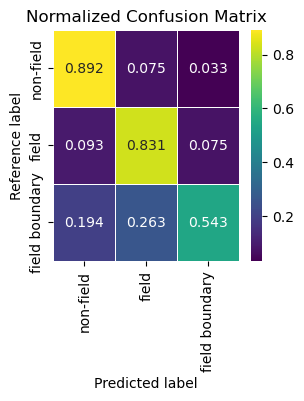

Train Loss 0.6250 | Train OA 0.864 | Val OA 0.862 | Val mIoU 0.588
✓ Saved new best model at epoch 11 with mIoU: 0.5878


Epoch 12 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 12 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

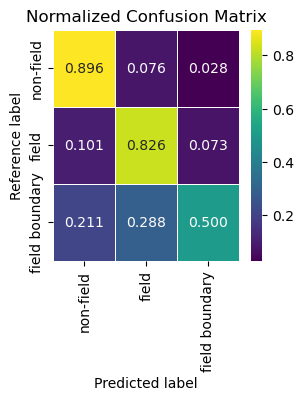

Epoch 12 ▸ evaluating (val set)


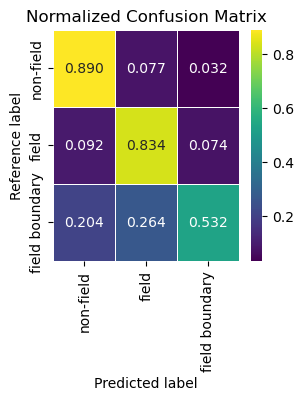

Train Loss 0.6235 | Train OA 0.864 | Val OA 0.862 | Val mIoU 0.587


Epoch 13 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 13 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

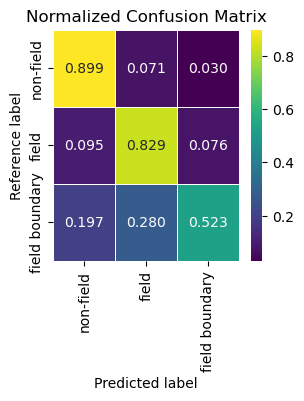

Epoch 13 ▸ evaluating (val set)


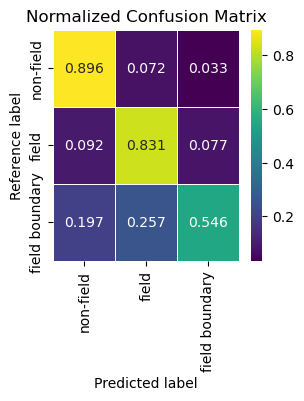

Train Loss 0.6221 | Train OA 0.868 | Val OA 0.865 | Val mIoU 0.591
✓ Saved new best model at epoch 13 with mIoU: 0.5908


Epoch 14 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 14 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

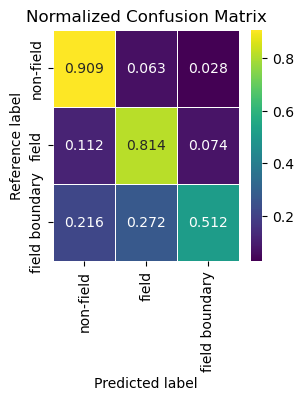

Epoch 14 ▸ evaluating (val set)


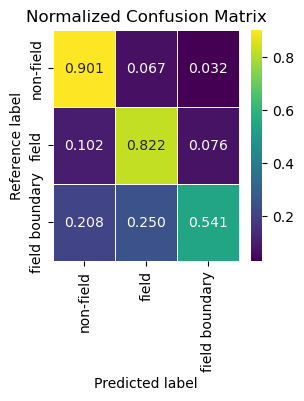

Train Loss 0.6207 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.591
✓ Saved new best model at epoch 14 with mIoU: 0.5913


Epoch 15 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 15 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

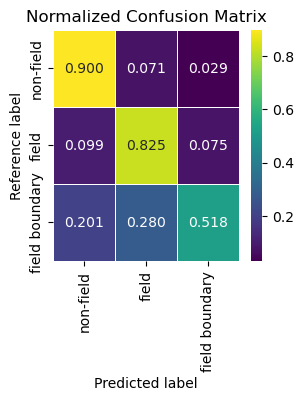

Epoch 15 ▸ evaluating (val set)


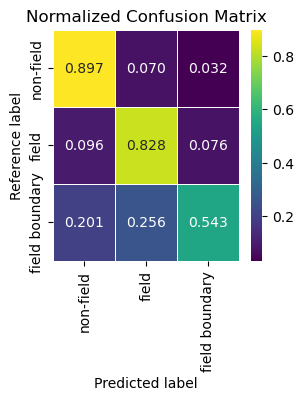

Train Loss 0.6201 | Train OA 0.867 | Val OA 0.865 | Val mIoU 0.590


Epoch 16 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 16 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

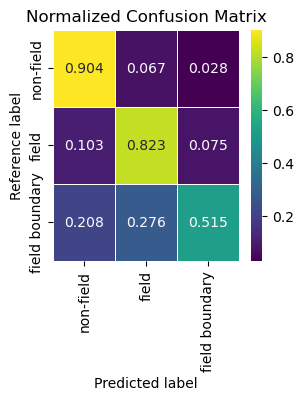

Epoch 16 ▸ evaluating (val set)


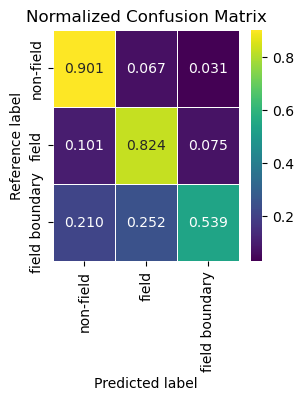

Train Loss 0.6199 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.592
✓ Saved new best model at epoch 16 with mIoU: 0.5919


Epoch 17 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 17 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

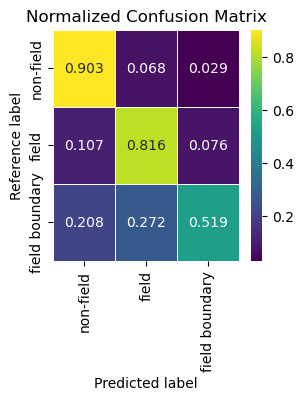

Epoch 17 ▸ evaluating (val set)


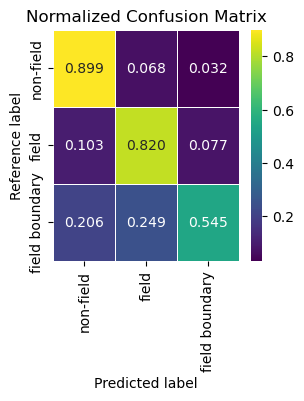

Train Loss 0.6197 | Train OA 0.866 | Val OA 0.864 | Val mIoU 0.589


Epoch 18 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 18 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

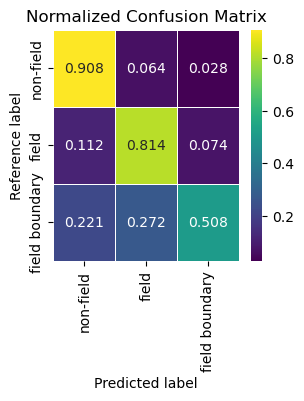

Epoch 18 ▸ evaluating (val set)


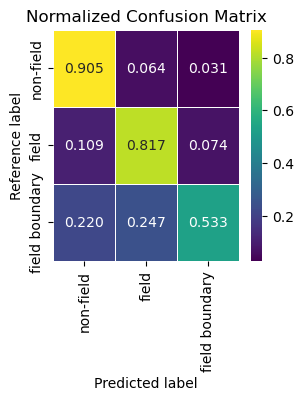

Train Loss 0.6195 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.591


Epoch 19 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 19 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

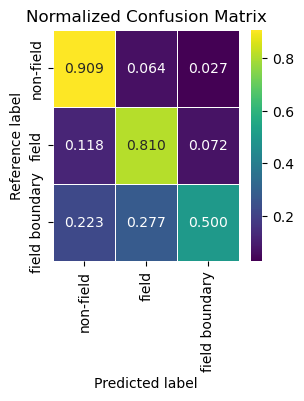

Epoch 19 ▸ evaluating (val set)


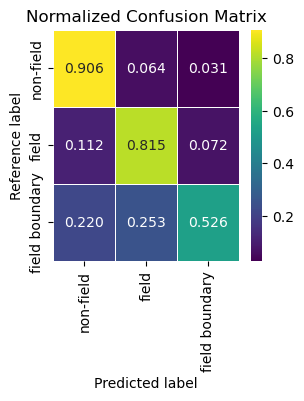

Train Loss 0.6195 | Train OA 0.868 | Val OA 0.866 | Val mIoU 0.590


Epoch 20 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 20 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

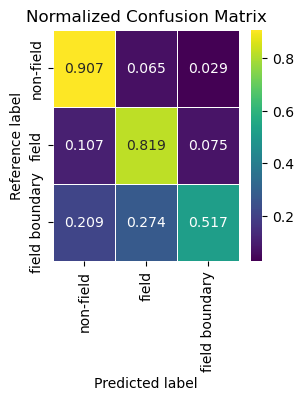

Epoch 20 ▸ evaluating (val set)


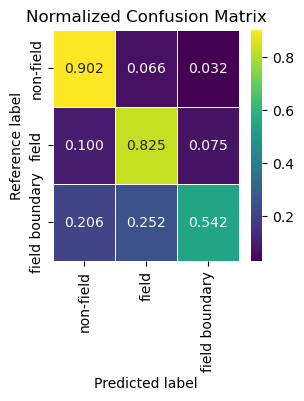

Train Loss 0.6192 | Train OA 0.869 | Val OA 0.867 | Val mIoU 0.593
✓ Saved new best model at epoch 20 with mIoU: 0.5930


Epoch 21 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 21 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

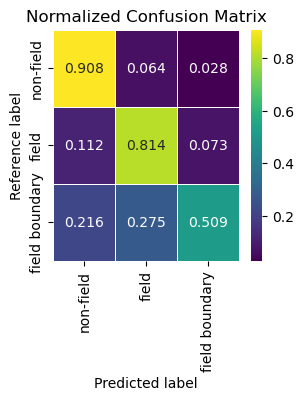

Epoch 21 ▸ evaluating (val set)


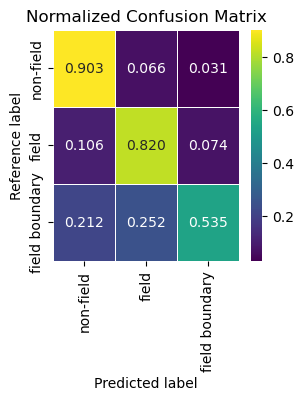

Train Loss 0.6194 | Train OA 0.868 | Val OA 0.866 | Val mIoU 0.591


Epoch 22 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 22 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

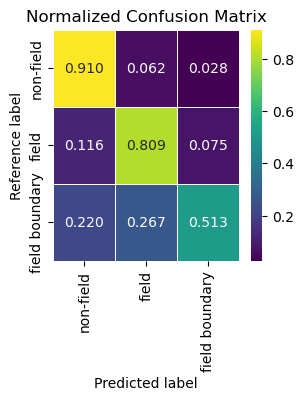

Epoch 22 ▸ evaluating (val set)


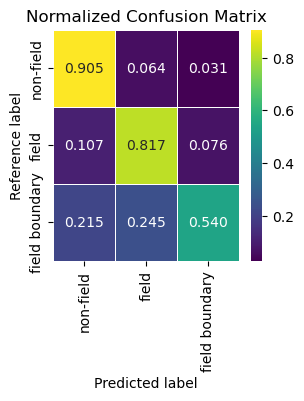

Train Loss 0.6196 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.592


Epoch 23 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 23 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

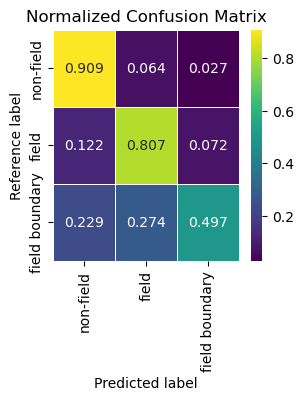

Epoch 23 ▸ evaluating (val set)


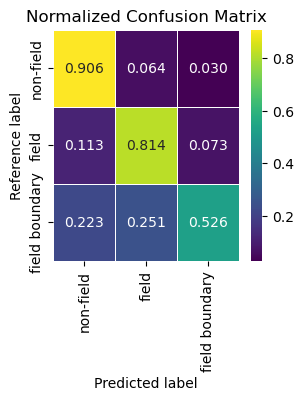

Train Loss 0.6193 | Train OA 0.867 | Val OA 0.866 | Val mIoU 0.590


Epoch 24 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 24 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

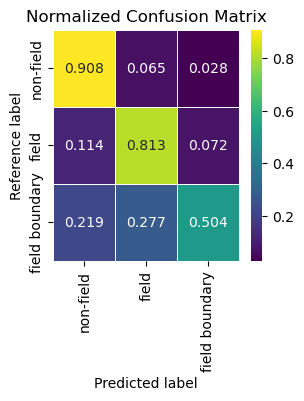

Epoch 24 ▸ evaluating (val set)


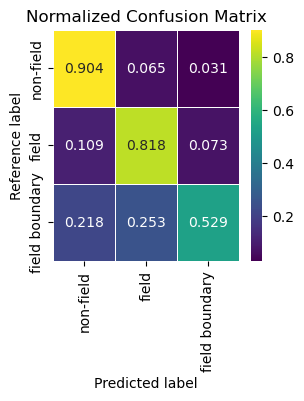

Train Loss 0.6192 | Train OA 0.868 | Val OA 0.866 | Val mIoU 0.591


Epoch 25 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 25 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

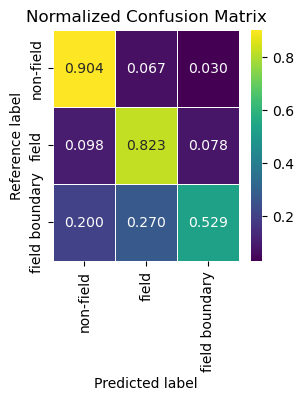

Epoch 25 ▸ evaluating (val set)


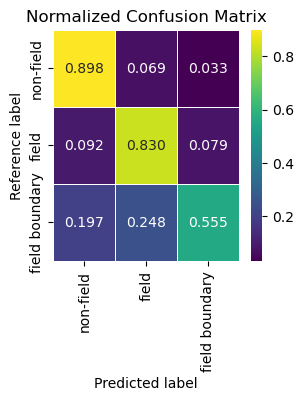

Train Loss 0.6191 | Train OA 0.869 | Val OA 0.867 | Val mIoU 0.593
✓ Saved new best model at epoch 25 with mIoU: 0.5934


Epoch 26 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 26 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

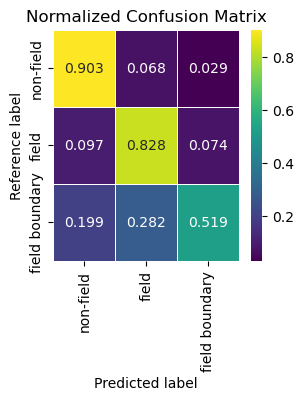

Epoch 26 ▸ evaluating (val set)


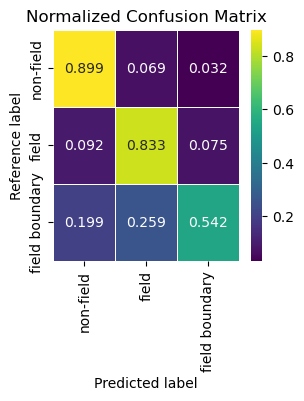

Train Loss 0.6193 | Train OA 0.870 | Val OA 0.867 | Val mIoU 0.594
✓ Saved new best model at epoch 26 with mIoU: 0.5939


Epoch 27 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 27 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

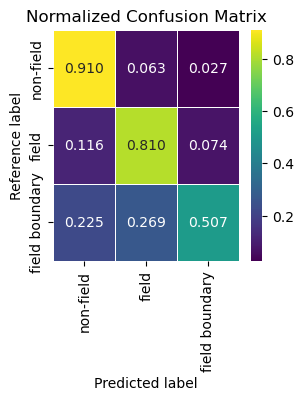

Epoch 27 ▸ evaluating (val set)


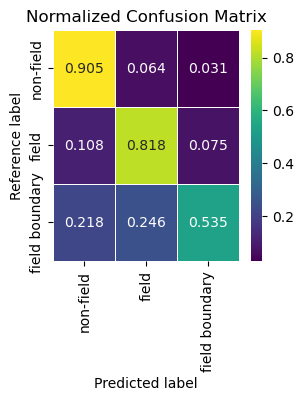

Train Loss 0.6192 | Train OA 0.868 | Val OA 0.866 | Val mIoU 0.591


Epoch 28 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 28 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

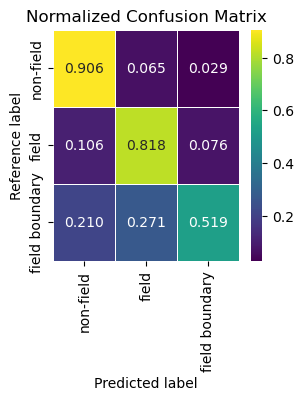

Epoch 28 ▸ evaluating (val set)


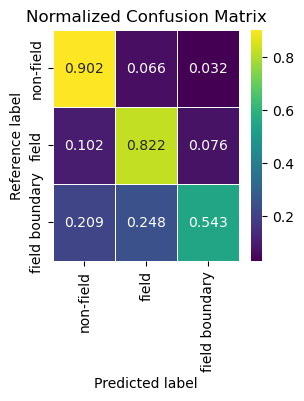

Train Loss 0.6191 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.592


Epoch 29 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 29 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

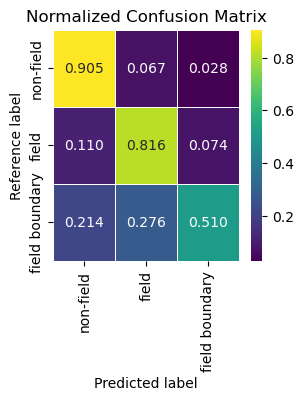

Epoch 29 ▸ evaluating (val set)


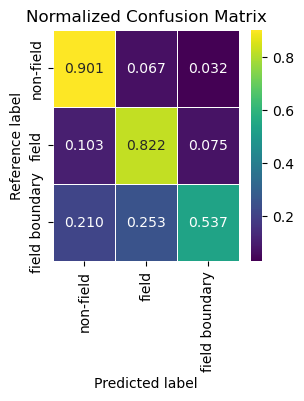

Train Loss 0.6193 | Train OA 0.867 | Val OA 0.866 | Val mIoU 0.591


Epoch 30 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 30 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

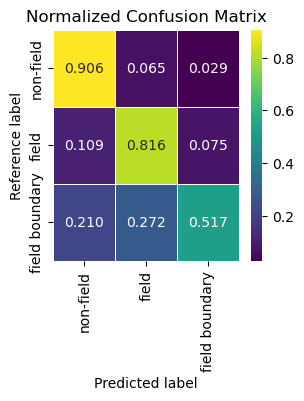

Epoch 30 ▸ evaluating (val set)


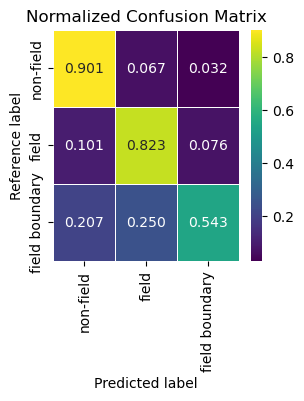

Train Loss 0.6192 | Train OA 0.868 | Val OA 0.866 | Val mIoU 0.592


Epoch 31 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 31 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

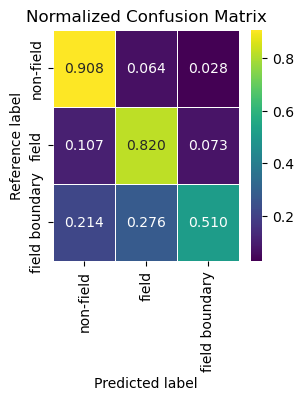

Epoch 31 ▸ evaluating (val set)


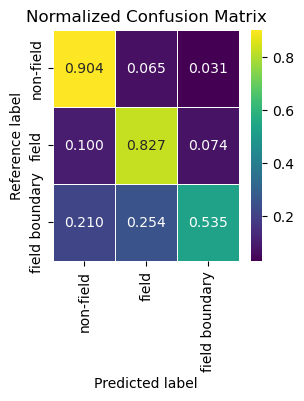

Train Loss 0.6191 | Train OA 0.870 | Val OA 0.868 | Val mIoU 0.594
✓ Saved new best model at epoch 31 with mIoU: 0.5944


Epoch 32 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 32 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

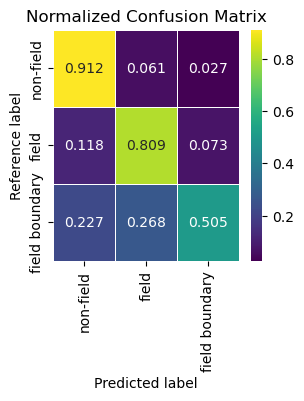

Epoch 32 ▸ evaluating (val set)


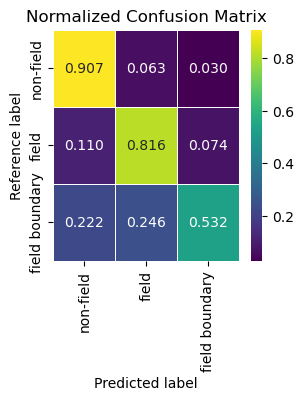

Train Loss 0.6195 | Train OA 0.870 | Val OA 0.867 | Val mIoU 0.592


Epoch 33 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 33 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

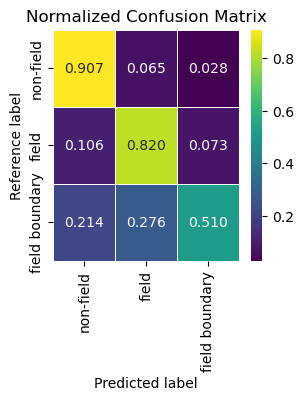

Epoch 33 ▸ evaluating (val set)


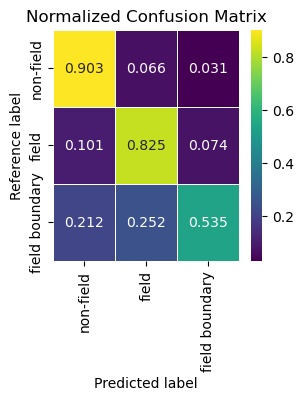

Train Loss 0.6189 | Train OA 0.870 | Val OA 0.868 | Val mIoU 0.593


Epoch 34 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 34 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

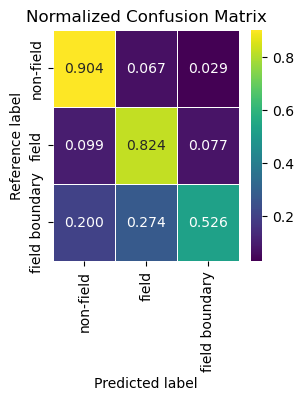

Epoch 34 ▸ evaluating (val set)


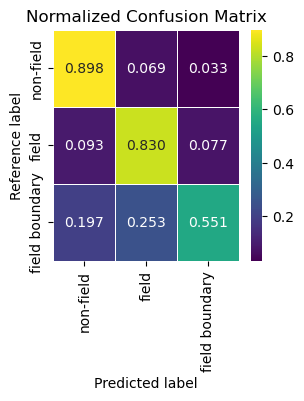

Train Loss 0.6191 | Train OA 0.869 | Val OA 0.866 | Val mIoU 0.593


Epoch 35 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

Epoch 35 ▸ evaluating (train set)


Evaluating:   0%|                                                  | 0/1744 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

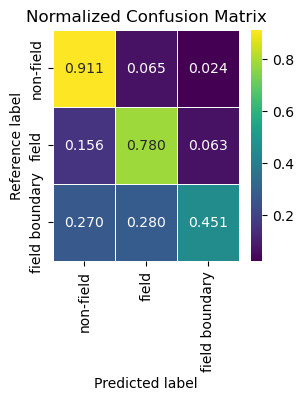

Epoch 35 ▸ evaluating (val set)


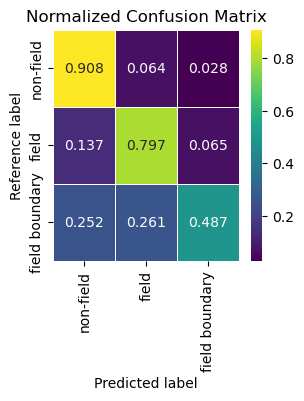

Train Loss 0.6192 | Train OA 0.859 | Val OA 0.861 | Val mIoU 0.580


Epoch 36 ▸ training:   0%|                                          | 0/872 [00:00<?, ?it/s]/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4343: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/airg/rbalogun/miniconda3/envs/ftw_fieldmapper/lib/python3.10/site-packages/torch/nn/functional.py:4404: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1

In [ ]:
# config_path = "/home/airg/rbalogun/ftwfieldmapper/src/configs/config_lacuna.yaml"
# working_dir="/home/airg/rbalogun/ftwfieldmapper/model_work"
# out_dir="ftw_exp_tversky_loss"
run_segmentation_ftw(config_path, model, train_dl, val_dl, working_dir, out_dir)

In [16]:
# import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "1"

### Testing on FTW Dataset


--------- Vanilla Model compiled successfully ---------
----------GPU available----------
total number of trainable parameters: 157.9M


Testing: 100%|██████████████████████████████| 122/122 [00:24<00:00,  5.03it/s]


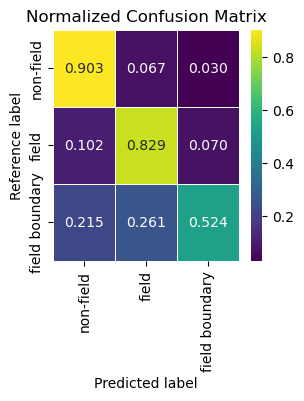


✓ Test-set evaluation complete
  Overall Acc : 0.868
  Mean IoU    : 0.593
  Confusion-matrix PNG  → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_confusion_matrix.png
  Metrics CSV          → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_metrics.csv


In [31]:
# ────────────────────────────────────────────────────────────────────────────────
#  test_inference_ftw.py
# ────────────────────────────────────────────────────────────────────────────────
import os, torch, yaml, csv, numpy as np, pandas as pd
from tqdm import tqdm
from src.lacuna.evaluate import Evaluator              # same Evaluator class

# ---------- paths ----------
config_path   = "/home/airg/rbalogun/ftwfieldmapper/src/configs/config_lacuna.yaml"
working_dir   = "/home/airg/rbalogun/ftwfieldmapper/model_work"
exp_name      = "ftw_exp_tversky_loss"
ckpt_path     = os.path.join(working_dir, exp_name, "best_model_miou.pth")
out_dir       = os.path.join(working_dir, exp_name)
os.makedirs(out_dir, exist_ok=True)

n_cls          = 4
class_mapping  = params_train["class_mapping"]
buffer         = params_train.get("buffer", None)


model = ModelCompiler(
        model = eval(params_train['model'])( 
                4,
                params_train['channels'],
                **params_train['model_kwargs']
                ),
        working_dir=params_train["model_working_dir"],
        out_dir=params_train["model_out_dir"],
        buffer=params_train["buffer"],
        class_mapping=params_train["class_mapping"],
        gpu_devices=params_train.get("gpu_devices", [0]),
        use_sync_bn=params_train.get("use_sync_bn", False),
        model_init_type=params_train.get("model_init_type", "kaiming"),
        params_init= None, #params_train.get("params_init", None),
        freeze_params=eval(params_train.get("freeze_params", "None"))
    )
model = model.model

state = torch.load(ckpt_path, map_location="cpu")
state = {k.replace("module.", ""): v for k, v in state.items()}
model.load_state_dict(state, strict=False)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model  = model.to(device)
if torch.cuda.device_count() > 1:
    model = torch.nn.DataParallel(model, device_ids=[0,1,2], output_device=0)

evaluator = Evaluator(num_class=3)

model.eval()
with torch.no_grad():
    for batch in tqdm(test_dl, desc="Testing"):
        imgs  = batch["image"].to(device)
        if imgs.ndim == 5 and imgs.shape[1] == 1:   # strip dummy time dim
            imgs = imgs.squeeze(1)
        lbls  = batch["mask"].long().squeeze(1).to(device)

        preds = torch.argmax(model(imgs), dim=1)

        if buffer:
            evaluator.add_batch(
                lbls[:, buffer:-buffer, buffer:-buffer].cpu().numpy(),
                preds[:, buffer:-buffer, buffer:-buffer].cpu().numpy())
        else:
            evaluator.add_batch(lbls.cpu().numpy(), preds.cpu().numpy())


cm_png = os.path.join(out_dir, "test_confusion_matrix.png")
evaluator.plot_confusion_matrix(class_mapping, cm_png)

def _dump_metrics_csv(evaluator, class_mapping, out_path):
    class_acc = evaluator.classwise_overall_accuracy()
    IoU       = evaluator.intersection_over_union()
    prec      = evaluator.precision()
    rec       = evaluator.recall()
    f1        = evaluator.f1_score()

    with open(out_path, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["Metric", "Value"])
        w.writerow(["Overall Accuracy", evaluator.overall_accuracy()])
        w.writerow(["Mean Accuracy",   np.nanmean(class_acc)])
        w.writerow(["Mean IoU",        np.nanmean(IoU)])
        w.writerow(["Mean Precision",  np.nanmean(prec)])
        w.writerow(["Mean Recall",     np.nanmean(rec)])
        w.writerow(["Mean F1 Score",   np.nanmean(f1)])

    per_cls = out_path.replace(".csv", "_classwise.csv")
    with open(per_cls, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["Class", "Accuracy", "IoU", "Precision", "Recall", "F1 Score"])
        for i in range(evaluator.num_class):
            cname = class_mapping[i]
            w.writerow([cname, class_acc[i], IoU[i], prec[i], rec[i], f1[i]])

csv_path = os.path.join(out_dir, "test_metrics.csv")
_dump_metrics_csv(evaluator, class_mapping, csv_path)

# ---------- console summary ----------
print("\n✓ Test-set evaluation complete")
print(f"  Overall Acc : {evaluator.overall_accuracy():.3f}")
print(f"  Mean IoU    : {np.nanmean(evaluator.intersection_over_union()):.3f}")
print(f"  Confusion-matrix PNG  → {cm_png}")
print(f"  Metrics CSV          → {csv_path}")


In [39]:
import os, torch, numpy as np, matplotlib.pyplot as plt
from datetime import datetime

def _unpack_batch(batch):
    "Return (imgs, lbls) from dict or tuple/list."
    if isinstance(batch, dict):
        imgs, lbls = batch["image"], batch.get("mask", None)
    elif isinstance(batch, (list, tuple)):
        imgs, lbls = batch[0], batch[1] if len(batch) > 1 else None
    else:
        raise TypeError(f"Unsupported batch type: {type(batch)}")
    return imgs, lbls

# ──────────────────────────────────────────────────────────────────────────────
def visualize_predictions(model,
                          dataloader,
                          class_mapping: dict,
                          device,
                          num_images: int = 4,
                          save_dir: str | None = None,
                          fname_prefix: str = "pred",
                          ignore_index: int | None = None):
    """
    Shows and (optionally) saves side-by-side Input / GroundTruth / Prediction.

    • Works with both dict batches {"image":…, "mask":…} and tuple batches
      (image, mask [, …]).
    • If `ignore_index` is set, those pixels are shown in black.
    """
    if save_dir: os.makedirs(save_dir, exist_ok=True)

    model.eval()
    cmap = plt.get_cmap("tab10")

    shown = 0
    with torch.no_grad():
        for batch in dataloader:
            imgs, lbls = _unpack_batch(batch)
            imgs = imgs.to(device)

            # squeeze dummy temporal dim if present
            if imgs.ndim == 5 and imgs.shape[1] == 1:
                imgs = imgs.squeeze(1)
            if lbls is not None and lbls.ndim == 4:  # Bx1xHxW → BxHxW
                lbls = lbls.squeeze(1).to(device)

            preds = torch.argmax(model(imgs), dim=1)

            for b in range(imgs.size(0)):
                if shown >= num_images:
                    return
                shown += 1

                img_np  = imgs[b].cpu().numpy()
                pred_np = preds[b].cpu().numpy()
                lbl_np  = lbls[b].cpu().numpy() if lbls is not None else None

                # Use first 3 channels for display
                rgb = img_np[:3] if img_np.shape[0] >= 3 else img_np
                rgb = np.moveaxis(rgb, 0, -1)              # C,H,W → H,W,C
                rgb = (rgb - rgb.min()) / np.ptp(rgb + 1e-8)

                # mask ignore pixels
                if ignore_index is not None and lbl_np is not None:
                    lbl_mask = lbl_np.copy()
                    lbl_mask[lbl_mask == ignore_index] = -1
                    pred_mask = pred_np.copy()
                    pred_mask[pred_mask == ignore_index] = -1
                else:
                    lbl_mask, pred_mask = lbl_np, pred_np

                # ------- plot -------
                fig, ax = plt.subplots(1, 3, figsize=(12, 4))
                ax[0].imshow(rgb);              ax[0].set_title("Input");       ax[0].axis("off")
                if lbl_np is not None:
                    im1 = ax[1].imshow(lbl_mask, cmap=cmap,
                                       vmin=0, vmax=len(class_mapping)-1)
                    ax[1].set_title("Ground Truth"); ax[1].axis("off")
                im2 = ax[2].imshow(pred_mask, cmap=cmap,
                                   vmin=0, vmax=len(class_mapping)-1)
                ax[2].set_title("Prediction");    ax[2].axis("off")

                plt.tight_layout(); plt.show()

                # ------- save -------
                if save_dir:
                    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
                    fname = f"{fname_prefix}_{shown}_{timestamp}.png"
                    fig.savefig(os.path.join(save_dir, fname),
                                dpi=300, bbox_inches="tight")
                    plt.close(fig)
                    print("Saved →", os.path.join(save_dir, fname))


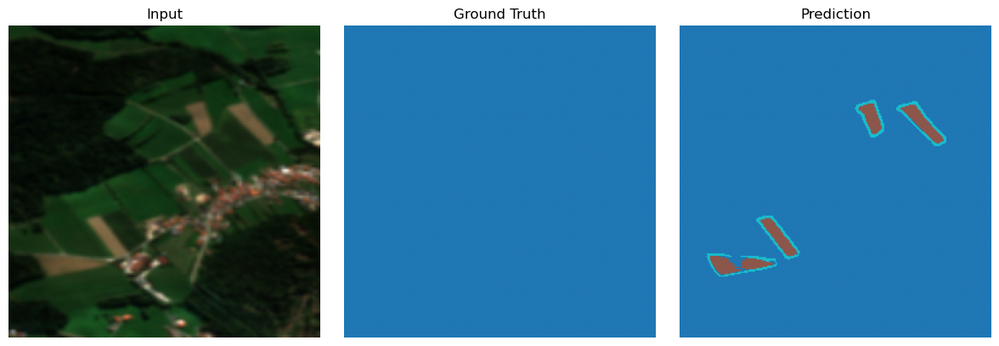

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_1_20250507_015429.png


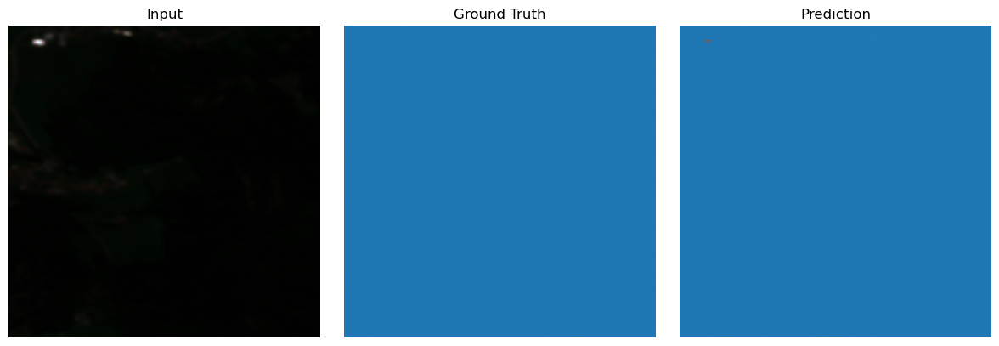

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_2_20250507_015430.png


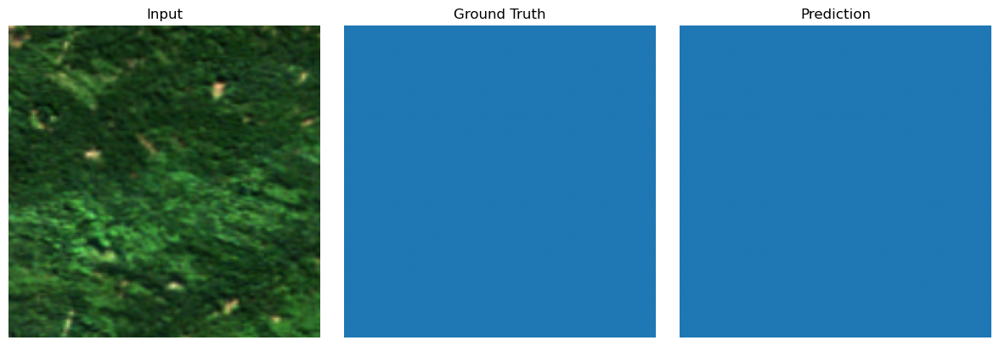

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_3_20250507_015431.png


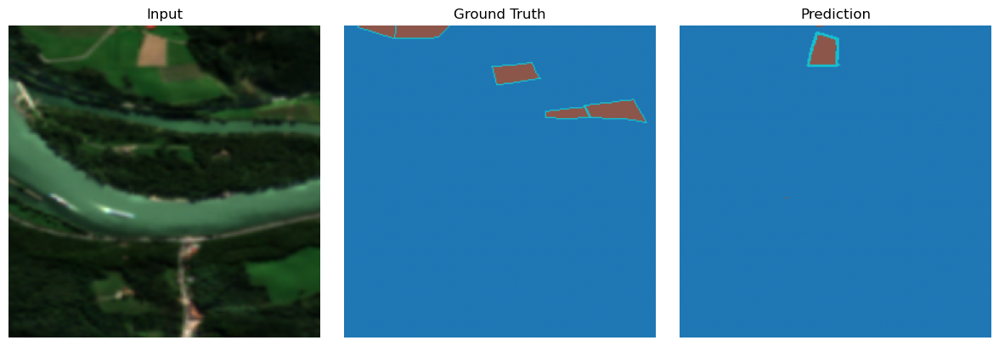

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_4_20250507_015431.png


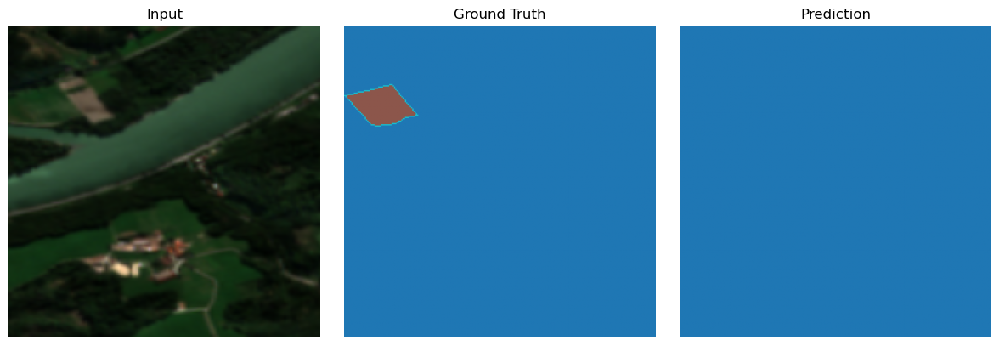

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_5_20250507_015432.png


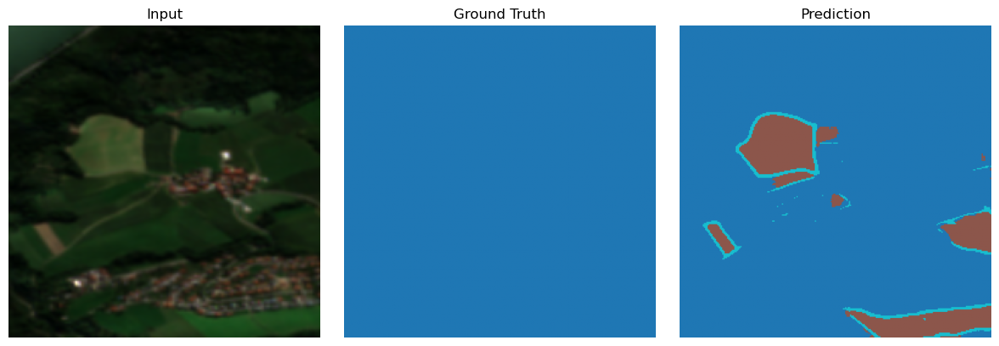

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_6_20250507_015432.png


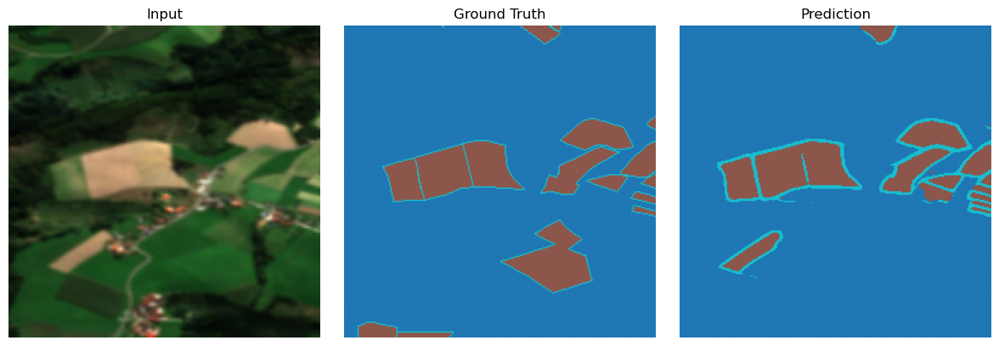

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_7_20250507_015433.png


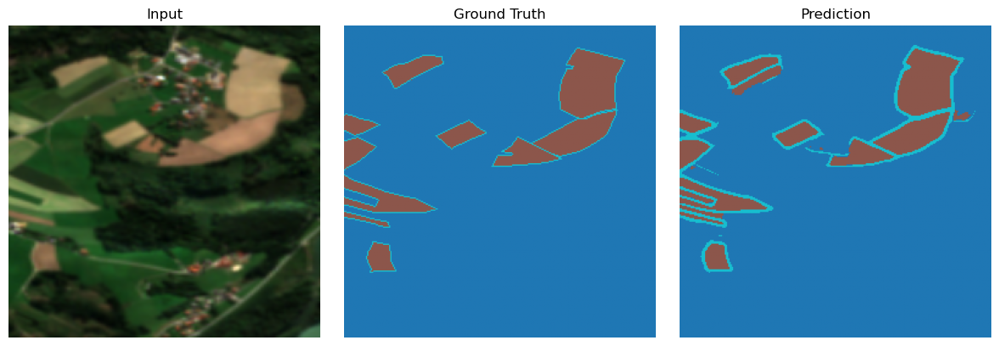

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_8_20250507_015434.png


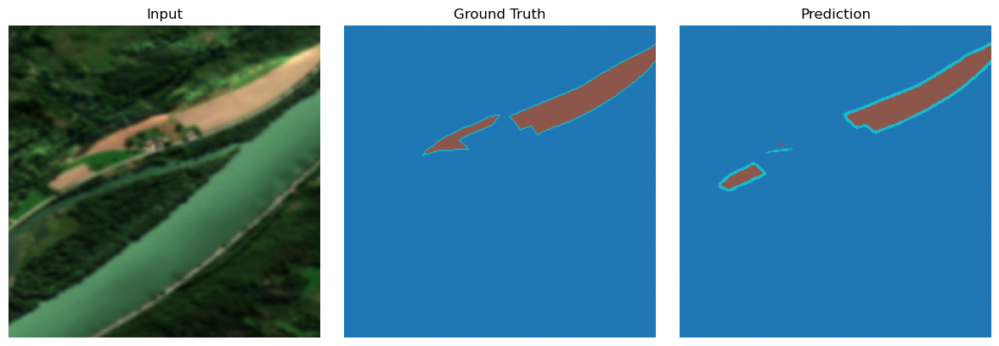

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_9_20250507_015434.png


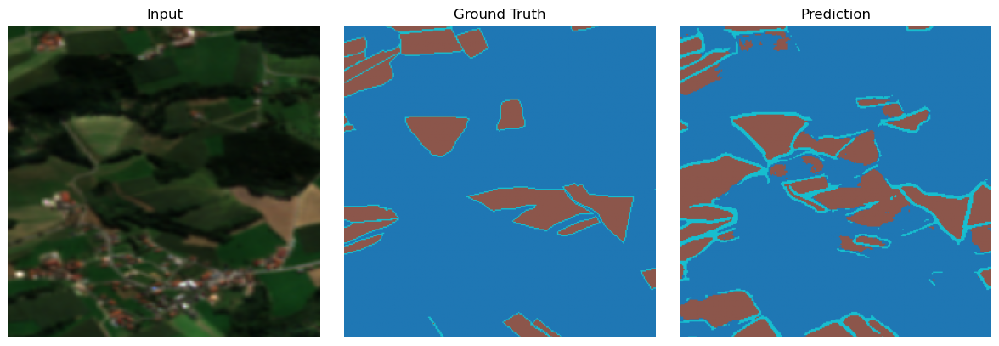

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_10_20250507_015435.png


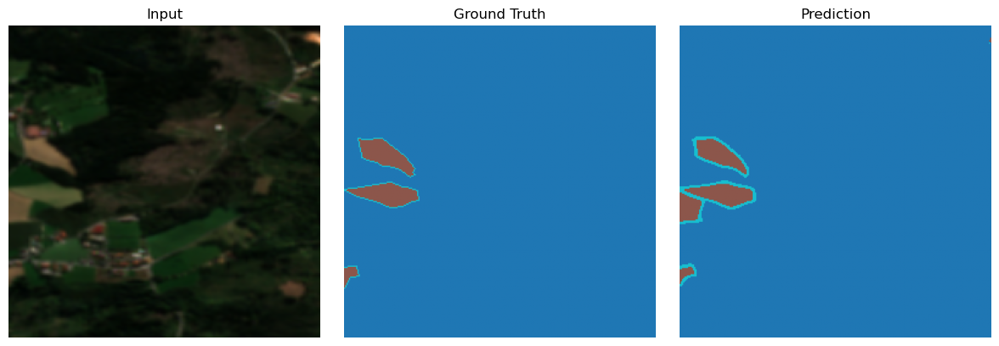

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_11_20250507_015435.png


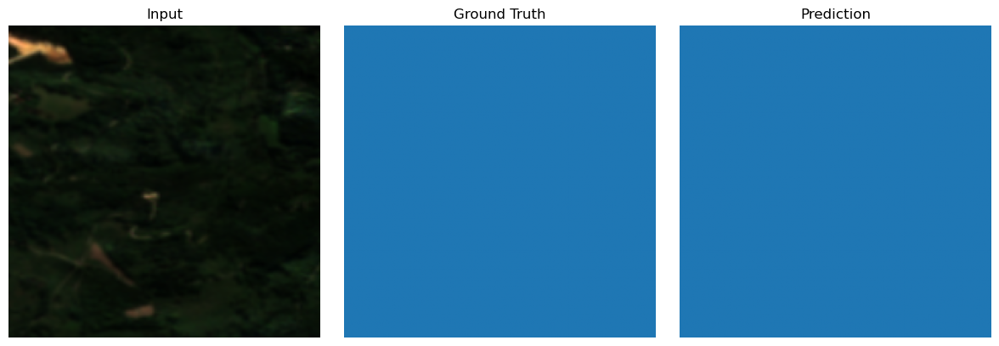

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_12_20250507_015436.png


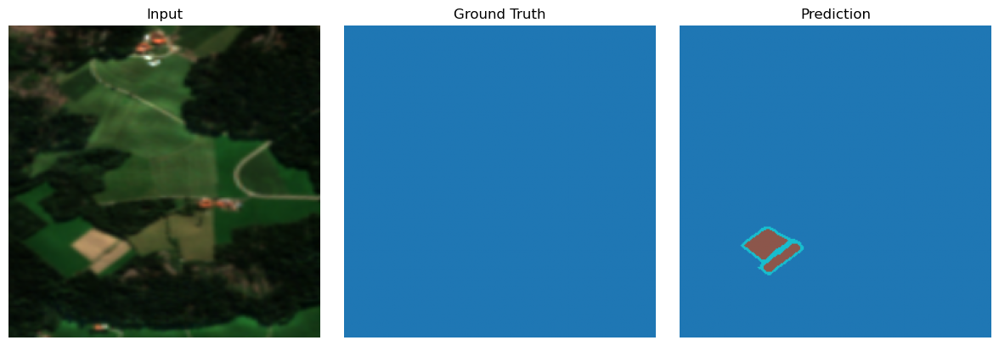

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_13_20250507_015437.png


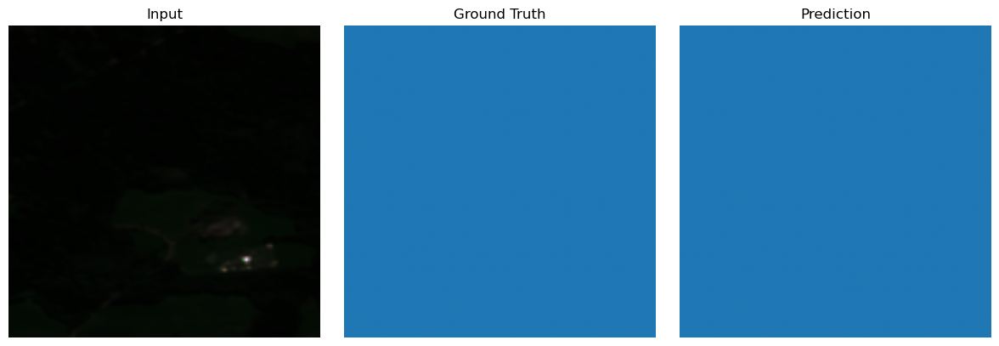

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_14_20250507_015438.png


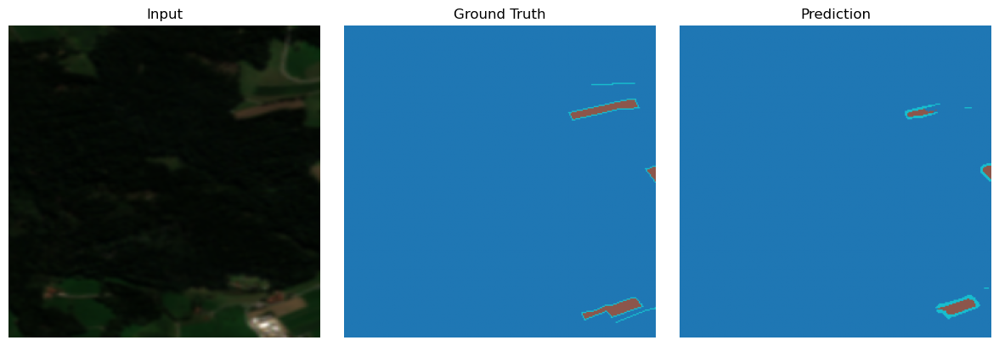

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_15_20250507_015438.png


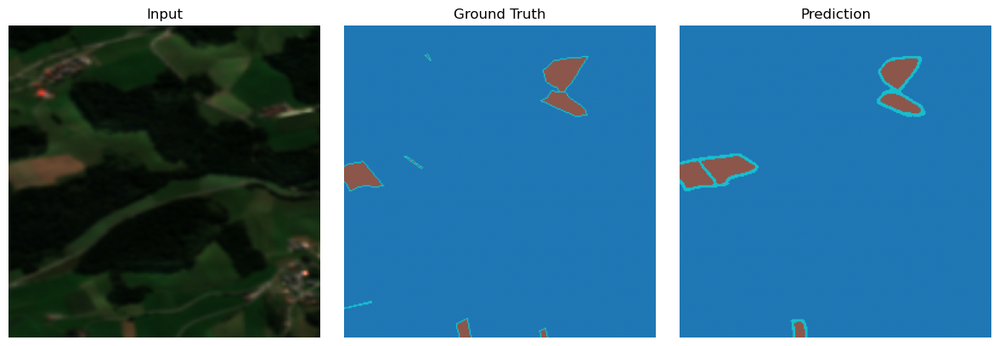

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_16_20250507_015439.png


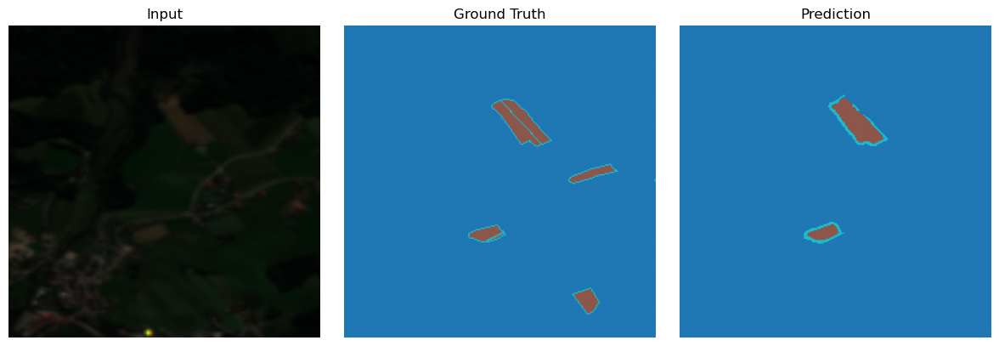

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_17_20250507_015439.png


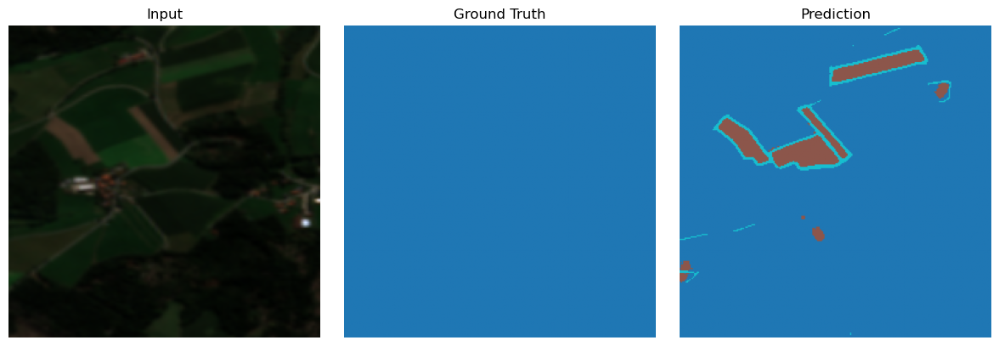

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_18_20250507_015440.png


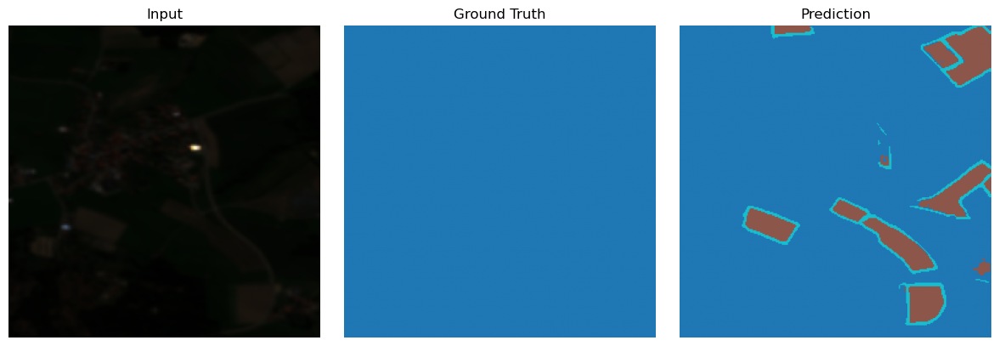

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_19_20250507_015440.png


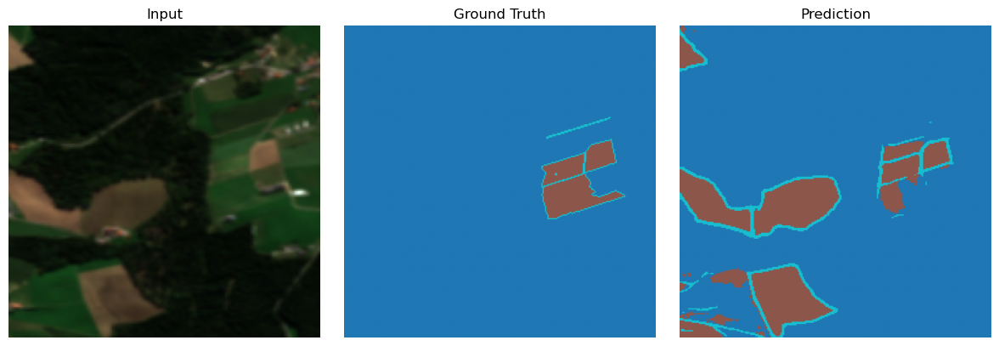

Saved → /home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/test_pred_20_20250507_015441.png


In [42]:
class_mapping = params_train["class_mapping"]
device = torch.device("cuda:0")
visualize_predictions(model,
                      dataloader   = val_dl,
                      class_mapping= class_mapping,
                      device       = device,
                      num_images   = 20,
                      save_dir     = "/home/airg/rbalogun/ftwfieldmapper/model_work/ftw_exp_tversky_loss/",
                      fname_prefix = "_pred",
                      ignore_index = 3) 


## Finetuning

In [11]:
config_path = "/home/airg/rbalogun/ftwfieldmapper/src/configs/config_lacuna.yaml"
working_dir="/home/airg/rbalogun/ftwfieldmapper/model_work"
out_dir="ftw_exp_tversky_loss_finetune"

In [12]:
# load lacuna datasets. 
from src.lacuna.datatorch import ImageData

# Load data
print('Loading training dataset')
            
train_dataset = ImageData(
        data_path = params_train['data_path'],
        log_dir = params_train['log_dir'], 
        catalog = pd.read_csv(params_train['train_csv_name']).reset_index(drop=True), 
        data_size = params_train['data_size'],
        buffer = params_train['buffer'],
        buffer_comp = params_train['buffer_comp'],
        usage = "train", 
        img_path_cols = params_train['img_path_cols'], 
        label_path_col = params_train['label_path_col'], 
        label_group = params_train['label_group'], 
        apply_normalization = params_train['apply_normalization'],
        normal_strategy = params_train['normal_strategy'],
        stat_procedure = params_train['stat_procedure'],
        global_stats = params_train['global_stats'],
        catalog_index = params_train['catalog_index'],
        trans = params_train['trans'],
        parallel = params_train['parallel'],
        scale_factor = params_train['scale_factor'],
        crop_strategy = params_train['crop_strategy'],
        rotation_degree = params_train['rotation_degree'],
        sigma_range = params_train['sigma_range'],
        br_range = params_train['br_range'],
        contrast_range = params_train['contrast_range'],
        bshift_gamma_range = params_train['bshift_gamma_range'],
        patch_shift = params_train['patch_shift'],
        downfactor = params_train['downfactor'],
        clip_val = params_train['clip_val'],
        nodata = params_train['nodata']
        )
    
train_dataloader = DataLoader(
                        train_dataset,
                        batch_size=params_train["train_batch"],
                        shuffle=True
                        )

# Load data
print('Loading validation dataset')

val_dataset = ImageData(
        data_path = params_train['data_path'],
        log_dir = params_train['log_dir'], 
        catalog = pd.read_csv(params_train['train_csv_name']).reset_index(drop=True), 
        data_size = params_train['data_size'],
        buffer = params_train['buffer'],
        buffer_comp = params_train['buffer_comp'],
        usage = "validate", 
        img_path_cols = params_train['img_path_cols'], 
        label_path_col = params_train['label_path_col'], 
        label_group = params_train['label_group'], 
        apply_normalization = params_train['apply_normalization'],
        normal_strategy = params_train['normal_strategy'],
        stat_procedure = params_train['stat_procedure'],
        global_stats = params_train['global_stats'],
        catalog_index = params_train['catalog_index'],
        trans = params_train['trans'],
        parallel = params_train['parallel'],
        scale_factor = params_train['scale_factor'],
        crop_strategy = params_train['crop_strategy'],
        rotation_degree = params_train['rotation_degree'],
        sigma_range = params_train['sigma_range'],
        br_range = params_train['br_range'],
        contrast_range = params_train['contrast_range'],
        bshift_gamma_range = params_train['bshift_gamma_range'],
        patch_shift = params_train['patch_shift'],
        downfactor = params_train['downfactor'],
        clip_val = params_train['clip_val'],
        nodata = params_train['nodata']
        )

val_dataloader = DataLoader(
                        val_dataset,
                        batch_size=params_train["validate_batch"],
                        shuffle=False
                        )

Loading training dataset
type: <class 'numpy.ndarray'> shape/len: (224, 224, 4)
----------20241 samples loaded in train dataset-----------
Total number of samples in train dataset: 20241
Loading validation dataset
type: <class 'numpy.ndarray'> shape/len: (224, 224, 4)
----------6746 samples loaded in validate dataset-----------
Total number of samples in validate dataset: 6746


In [52]:
import torch
from collections import OrderedDict
def load_checkpoint(model, ckpt_path, strict: bool = False, verbose: bool = True):
    ckpt = torch.load(ckpt_path, map_location="cpu")
    if isinstance(ckpt, dict) and any(k in ckpt for k in ("state_dict", "model", "model_state")):
        ckpt = ckpt.get("state_dict") or ckpt.get("model_state") or ckpt.get("model")
    cleaned = OrderedDict()
    for k, v in ckpt.items():
        k_clean = k[7:] if k.startswith("module.") else k
        if k_clean in model.state_dict() and model.state_dict()[k_clean].shape == v.shape:
            cleaned[k_clean] = v

    msg = model.load_state_dict(cleaned, strict=strict)
    return msg

# model

In [17]:
from src.lacuna.compiler import ModelCompiler
from src.lacuna.models import unet_att_d

config_path = "/home/airg/rbalogun/ftwfieldmapper/src/configs/config_lacuna.yaml"
working_dir = "/home/airg/rbalogun/ftwfieldmapper/model_work"
out_dir     = "ftw_exp_tversky_loss_finetune"
ckpt_path = "model_out/exp_tversky_loss/best_model.pth"

model = ModelCompiler(
        model = eval(params_train['model'])( 
                3,
                params_train['channels'],
                **params_train['model_kwargs']
                ),
        working_dir=params_train["model_working_dir"],
        out_dir=params_train["model_out_dir"],
        buffer=params_train["buffer"],
        class_mapping=params_train["class_mapping"],
        gpu_devices=params_train.get("gpu_devices", [0]),
        use_sync_bn=params_train.get("use_sync_bn", False),
        model_init_type=params_train.get("model_init_type", "kaiming"),
        params_init= None, #params_train.get("params_init", None),
        freeze_params=eval(params_train.get("freeze_params", "None"))
    )

model = model.model
ckpt = torch.load(ckpt_path, map_location="cpu")
model.load_state_dict(ckpt, strict=False)

root_dev = torch.device("cuda:0")        
model   = model.to(root_dev) 
if torch.cuda.device_count() > 1:
    model = torch.nn.DataParallel(model,
                                  device_ids=[0,1,2],   
                                  output_device=0)      
print("‣ DataParallel devices:", model.device_ids)     


--------- Vanilla Model compiled successfully ---------
----------GPU available----------
total number of trainable parameters: 157.9M
‣ DataParallel devices: [0, 1, 2]


In [22]:
import csv, os, torch, numpy as np, pandas as pd
from tqdm import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau
from src.lacuna.evaluate import Evaluator
from src.lacuna.losses import tversky_focal 
import os, torch, pandas as pd
from tqdm import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau
from src.lacuna.losses   import tversky_focal

def evaluate_dataloader(model, dataloader, num_classes, class_mapping,
                        device, buffer=None, out_name=None):
    """
    Runs the whole loader through `model` once and returns the metrics dict
    produced by Evaluator (overall acc, mIoU, etc.).
    """
    model.eval()
    evaluator = Evaluator(num_classes)

    with torch.no_grad():
        for imgs, labels in tqdm(dataloader, desc="Evaluating", leave=False):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            _, preds = torch.max(outputs.data, 1)

            if buffer:
                evaluator.add_batch(
                    labels[:, buffer:-buffer, buffer:-buffer].cpu().numpy(),
                    preds[:,  buffer:-buffer, buffer:-buffer].cpu().numpy()
                )
            else:
                evaluator.add_batch(labels.cpu().numpy(), preds.cpu().numpy())

    # Plot and/or save confusion matrix + csv, exactly as in your original fn
    if out_name:
        plot_name = out_name.rsplit(".", 1)[0] + ".png"
        evaluator.plot_confusion_matrix(class_mapping, plot_name)
        _dump_metrics_csv(evaluator, class_mapping, out_name)   # helper below
    else:
        evaluator.plot_confusion_matrix(class_mapping)

    # Collect the scalar metrics you care about
    metrics = {
        "Overall Accuracy":         evaluator.overall_accuracy(),
        "Mean Accuracy":            np.nanmean(evaluator.classwise_overall_accuracy()),
        "Mean IoU":                 np.nanmean(evaluator.intersection_over_union()),
        "Mean Precision":           np.nanmean(evaluator.precision()),
        "Mean Recall":              np.nanmean(evaluator.recall()),
        "Mean F1 Score":            np.nanmean(evaluator.f1_score())
    }
    return metrics


def _dump_metrics_csv(evaluator, class_mapping, out_name):
    """Helper for optional CSV export (kept identical to your code)."""
    class_acc     = evaluator.classwise_overall_accuracy()
    IoU           = evaluator.intersection_over_union()
    precision     = evaluator.precision()
    recall        = evaluator.recall()
    f1_score      = evaluator.f1_score()

    with open(out_name, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Metric", "Value"])
        writer.writerow(["Overall Accuracy", evaluator.overall_accuracy()])
        writer.writerow(["Mean Accuracy",   np.nanmean(class_acc)])
        writer.writerow(["Mean IoU",        np.nanmean(IoU)])
        writer.writerow(["Mean Precision",  np.nanmean(precision)])
        writer.writerow(["Mean Recall",     np.nanmean(recall)])
        writer.writerow(["Mean F1 Score",   np.nanmean(f1_score)])

    cls_file = out_name.rsplit(".", 1)[0] + "_classwise." + out_name.rsplit(".", 1)[1]
    with open(cls_file, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Class", "Accuracy", "IoU", "Precision", "Recall", "F1 Score"])
        for i in range(evaluator.num_class):
            cname = class_mapping[i]
            writer.writerow([cname, class_acc[i], IoU[i], precision[i], recall[i], f1_score[i]])
            

def run_segmentation_lacuna(model,
                            train_dataloader,
                            val_dataloader,
                            params_train: dict,
                            device: torch.device,
                            checkpoint_root: str = "./checkpoints"):
    """
    Fine-tunes `model` on Lacuna Labels.

    Args
    ----
    model            (nn.Module)  : network *already* on `device`
    train_dataloader (DataLoader) : batches (img, mask)
    val_dataloader   (DataLoader) : batches (img, mask)
    params_train     (dict)       : section `Train_Validate` from YAML
    device           (torch.device)
    checkpoint_root  (str)        : folder for logs & weights
    """
    # ── 1 · losses, optimiser, scheduler ──────────────────────────────────────
    criterion  = tversky_focal.LocallyWeightedTverskyFocalLoss()
    optimizer  = torch.optim.Adam(model.parameters(),
                                  lr=params_train["learning_rate_init"])
    scheduler  = ReduceLROnPlateau(optimizer, mode="min",
                                   patience=10, verbose=True)

    num_epochs        = params_train["epoch"]
    early_stop_pat    = params_train.get("early_stopping_patience", 10)

    os.makedirs(checkpoint_root, exist_ok=True)
    best_val_loss, es_counter = float("inf"), 0
    log_records = []

    # ── 2 · epoch loop ───────────────────────────────────────────────────────
    for epoch in range(1, num_epochs + 1):
        print(f"\n— Epoch {epoch}/{num_epochs} —")

        # ♦ TRAIN
        model.train()
        run_loss, correct, total = 0.0, 0, 0

        for imgs, labels, _ in tqdm(train_dataloader, desc="Training", leave=False):
            imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            optimizer.zero_grad()
            loss = criterion(model(imgs), labels)
            loss.backward(); optimizer.step()

            run_loss += loss.item() * imgs.size(0)
            preds     = loss = None  # free memory immediately
            preds     = model(imgs).argmax(1)
            correct  += (preds == labels).sum().item()
            total    += labels.numel()

        train_loss = run_loss / len(train_dataloader.dataset)
        train_acc  = correct / total

        # ♦ VALIDATE
        model.eval()
        val_loss_accum, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for imgs, labels in tqdm(val_dataloader, desc="Validating", leave=False):
                imgs, labels = imgs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
                outputs      = model(imgs)
                val_loss_accum += criterion(outputs, labels).item() * imgs.size(0)

                preds    = outputs.argmax(1)
                correct += (preds == labels).sum().item()
                total   += labels.numel()

        val_loss = val_loss_accum / len(val_dataloader.dataset)
        val_acc  = correct / total
        scheduler.step(val_loss)

        # ♦ semantic metrics (mIoU, F1, …)
        sem_metrics = evaluate_dataloader(
            model          = model,
            dataloader     = val_dataloader,
            num_classes    = params_train["n_classes"],
            class_mapping  = params_train["class_mapping"],
            device         = device,
            out_name       = os.path.join(checkpoint_root,
                               f"epoch{epoch}_metrics.csv")
        )

        # ♦ LOG & CONSOLE
        log_records.append({
            "epoch":            epoch,
            "train_loss":       train_loss,
            "val_loss":         val_loss,
            "train_acc":        train_acc,
            "val_acc":          val_acc,
            "overall_accuracy": sem_metrics["Overall Accuracy"],
            "mean_accuracy":    sem_metrics["Mean Accuracy"],
            "mean_iou":         sem_metrics["Mean IoU"],
            "mean_precision":   sem_metrics["Mean Precision"],
            "mean_recall":      sem_metrics["Mean Recall"],
            "mean_f1_score":    sem_metrics["Mean F1 Score"],
        })

        print(f"Train ▸ loss {train_loss:.4f} acc {train_acc:.3f} | "
              f"Val ▸ loss {val_loss:.4f} acc {val_acc:.3f} | "
              f"OA {sem_metrics['Overall Accuracy']:.3f} mIoU {sem_metrics['Mean IoU']:.3f}")

        # ♦ CHECKPOINT
        if val_loss < best_val_loss:
            best_val_loss, es_counter = val_loss, 0
            torch.save(model.state_dict(),
                       os.path.join(checkpoint_root, "best_model.pth"))
            print("  ↳ new best model saved")
        else:
            es_counter += 1
            print(f"  ↳ early-stopping counter: {es_counter}/{early_stop_pat}")

        if es_counter >= early_stop_pat:
            print("Early stopping triggered.")
            break

    # ── 3 · persist epoch log ────────────────────────────────────────────────
    pd.DataFrame(log_records).to_csv(
        os.path.join(checkpoint_root, "training_metrics.csv"),
        index=False
    )
    print("✓ training complete – metrics saved.")



— Epoch 1/50 —


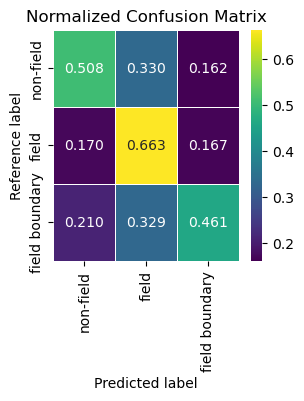

Train ▸ loss 0.6660 acc 0.618 | Val ▸ loss 0.7059 acc 0.569 | OA 0.569 mIoU 0.343
  ↳ new best model saved

— Epoch 2/50 —


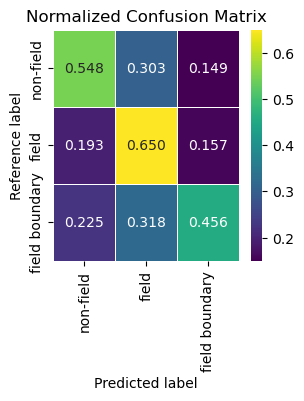

Train ▸ loss 0.6664 acc 0.618 | Val ▸ loss 0.6994 acc 0.584 | OA 0.584 mIoU 0.354
  ↳ new best model saved

— Epoch 3/50 —


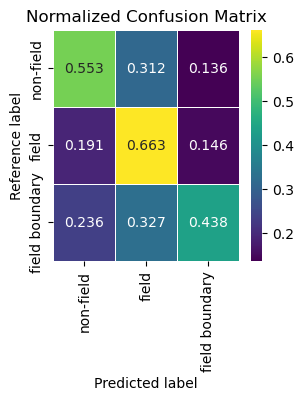

Train ▸ loss 0.6591 acc 0.625 | Val ▸ loss 0.6982 acc 0.591 | OA 0.591 mIoU 0.358
  ↳ new best model saved

— Epoch 4/50 —


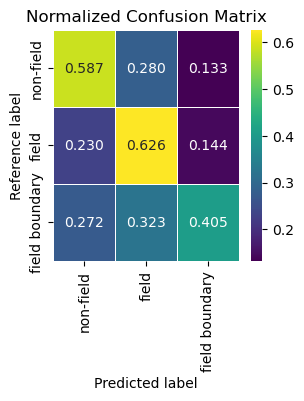

Train ▸ loss 0.6561 acc 0.629 | Val ▸ loss 0.7101 acc 0.591 | OA 0.591 mIoU 0.356
  ↳ early-stopping counter: 1/10

— Epoch 5/50 —


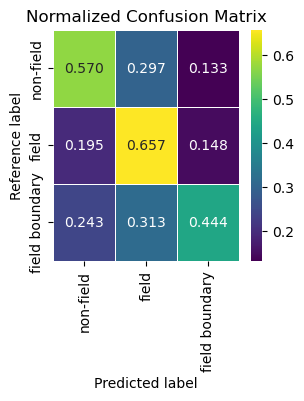

Train ▸ loss 0.6565 acc 0.629 | Val ▸ loss 0.6944 acc 0.597 | OA 0.597 mIoU 0.364
  ↳ new best model saved

— Epoch 6/50 —


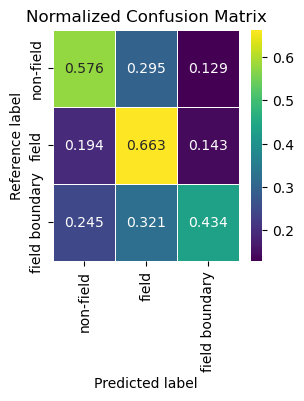

Train ▸ loss 0.6529 acc 0.634 | Val ▸ loss 0.6944 acc 0.603 | OA 0.603 mIoU 0.367
  ↳ new best model saved

— Epoch 7/50 —


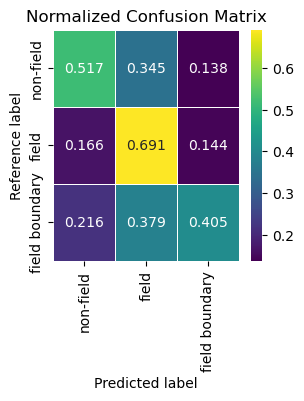

Train ▸ loss 0.6531 acc 0.634 | Val ▸ loss 0.7128 acc 0.581 | OA 0.581 mIoU 0.348
  ↳ early-stopping counter: 1/10

— Epoch 8/50 —


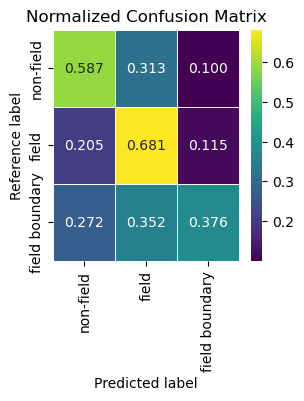

Train ▸ loss 0.6517 acc 0.636 | Val ▸ loss 0.7003 acc 0.612 | OA 0.612 mIoU 0.370
  ↳ early-stopping counter: 2/10

— Epoch 9/50 —


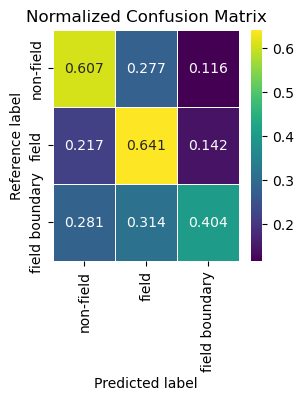

Train ▸ loss 0.6496 acc 0.639 | Val ▸ loss 0.7015 acc 0.608 | OA 0.608 mIoU 0.368
  ↳ early-stopping counter: 3/10

— Epoch 10/50 —


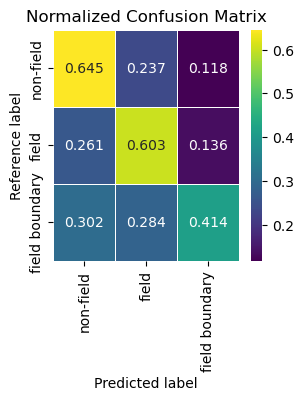

Train ▸ loss 0.6486 acc 0.640 | Val ▸ loss 0.6970 acc 0.612 | OA 0.612 mIoU 0.372
  ↳ early-stopping counter: 4/10

— Epoch 11/50 —


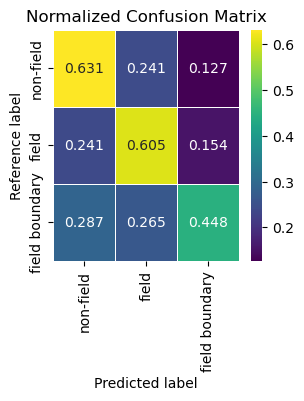

Train ▸ loss 0.6477 acc 0.642 | Val ▸ loss 0.6909 acc 0.608 | OA 0.608 mIoU 0.372
  ↳ new best model saved

— Epoch 12/50 —


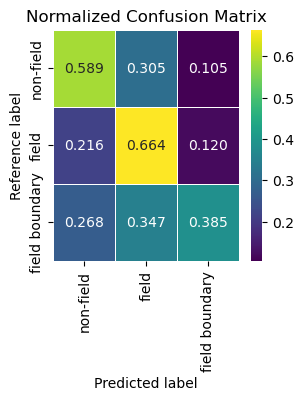

Train ▸ loss 0.6467 acc 0.643 | Val ▸ loss 0.7009 acc 0.607 | OA 0.607 mIoU 0.367
  ↳ early-stopping counter: 1/10

— Epoch 13/50 —


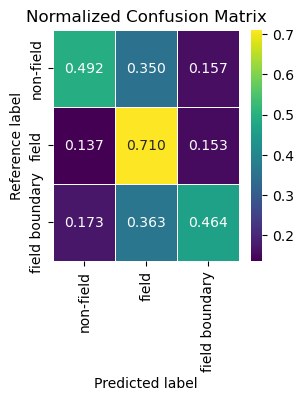

Train ▸ loss 0.6456 acc 0.645 | Val ▸ loss 0.6973 acc 0.580 | OA 0.580 mIoU 0.352
  ↳ early-stopping counter: 2/10

— Epoch 14/50 —


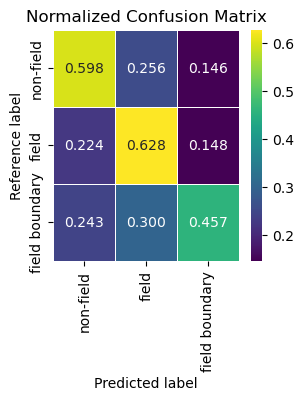

Train ▸ loss 0.6451 acc 0.646 | Val ▸ loss 0.6926 acc 0.601 | OA 0.601 mIoU 0.367
  ↳ early-stopping counter: 3/10

— Epoch 15/50 —


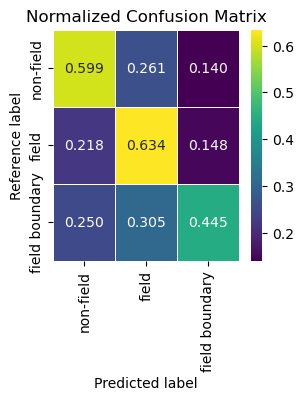

Train ▸ loss 0.6444 acc 0.647 | Val ▸ loss 0.6948 acc 0.603 | OA 0.603 mIoU 0.368
  ↳ early-stopping counter: 4/10

— Epoch 16/50 —


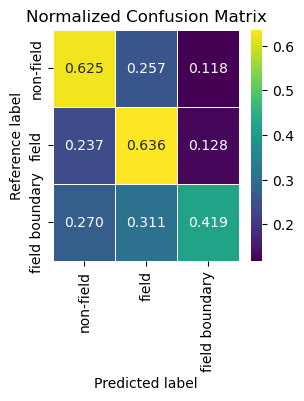

Train ▸ loss 0.6434 acc 0.648 | Val ▸ loss 0.6912 acc 0.615 | OA 0.615 mIoU 0.376
  ↳ early-stopping counter: 5/10

— Epoch 17/50 —


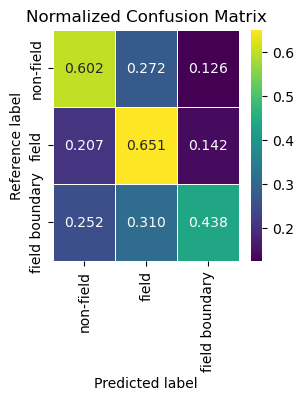

Train ▸ loss 0.6431 acc 0.649 | Val ▸ loss 0.6900 acc 0.611 | OA 0.611 mIoU 0.374
  ↳ new best model saved

— Epoch 18/50 —


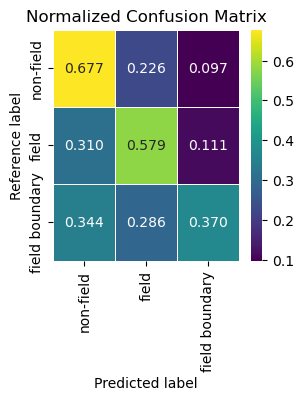

Train ▸ loss 0.6422 acc 0.650 | Val ▸ loss 0.7026 acc 0.616 | OA 0.616 mIoU 0.370
  ↳ early-stopping counter: 1/10

— Epoch 19/50 —


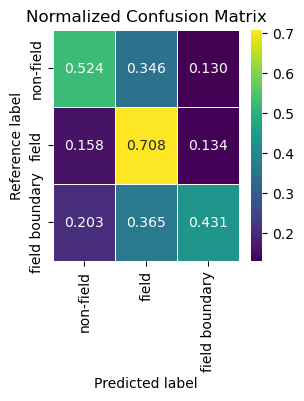

Train ▸ loss 0.6416 acc 0.651 | Val ▸ loss 0.6946 acc 0.594 | OA 0.594 mIoU 0.360
  ↳ early-stopping counter: 2/10

— Epoch 20/50 —


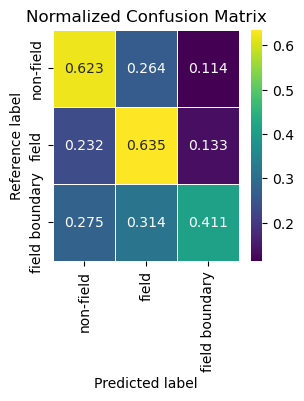

Train ▸ loss 0.6410 acc 0.651 | Val ▸ loss 0.6944 acc 0.614 | OA 0.614 mIoU 0.374
  ↳ early-stopping counter: 3/10

— Epoch 21/50 —


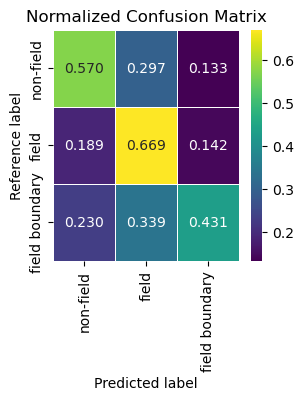

Train ▸ loss 0.6401 acc 0.653 | Val ▸ loss 0.6962 acc 0.602 | OA 0.602 mIoU 0.367
  ↳ early-stopping counter: 4/10

— Epoch 22/50 —


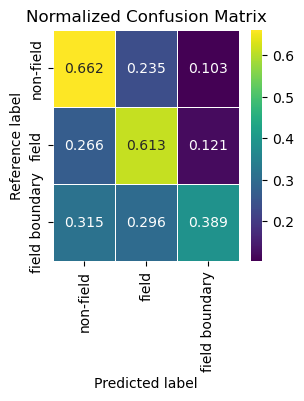

Train ▸ loss 0.6398 acc 0.653 | Val ▸ loss 0.6962 acc 0.624 | OA 0.624 mIoU 0.379
  ↳ early-stopping counter: 5/10

— Epoch 23/50 —


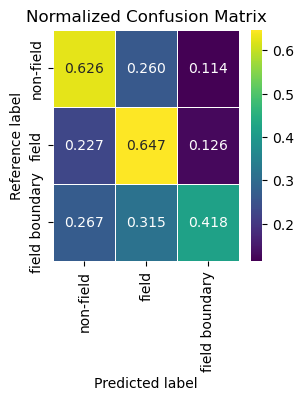

Train ▸ loss 0.6391 acc 0.653 | Val ▸ loss 0.6880 acc 0.621 | OA 0.621 mIoU 0.380
  ↳ new best model saved

— Epoch 24/50 —


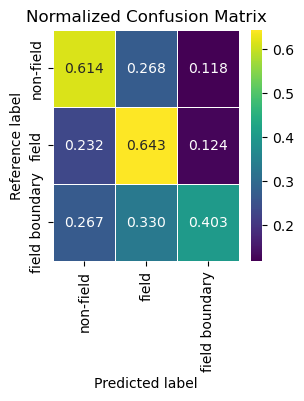

Train ▸ loss 0.6385 acc 0.655 | Val ▸ loss 0.6972 acc 0.612 | OA 0.612 mIoU 0.372
  ↳ early-stopping counter: 1/10

— Epoch 25/50 —


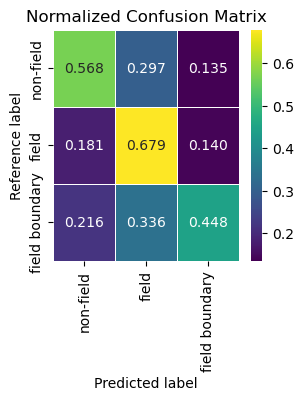

Train ▸ loss 0.6381 acc 0.656 | Val ▸ loss 0.6885 acc 0.606 | OA 0.606 mIoU 0.371
  ↳ early-stopping counter: 2/10

— Epoch 26/50 —


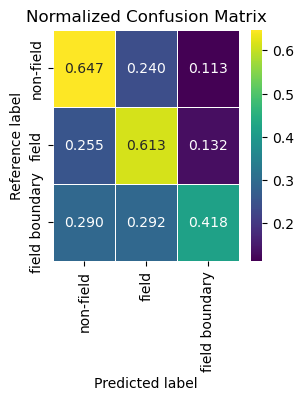

Train ▸ loss 0.6372 acc 0.657 | Val ▸ loss 0.6909 acc 0.618 | OA 0.618 mIoU 0.377
  ↳ early-stopping counter: 3/10

— Epoch 27/50 —


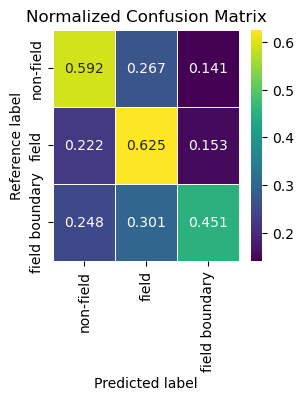

Train ▸ loss 0.6368 acc 0.657 | Val ▸ loss 0.6956 acc 0.596 | OA 0.596 mIoU 0.363
  ↳ early-stopping counter: 4/10

— Epoch 28/50 —


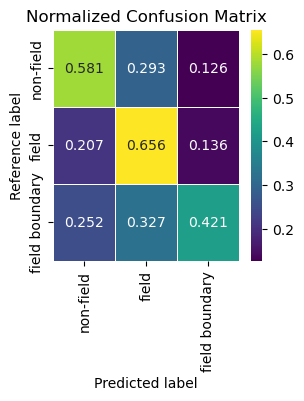

Train ▸ loss 0.6366 acc 0.657 | Val ▸ loss 0.6972 acc 0.602 | OA 0.602 mIoU 0.365
  ↳ early-stopping counter: 5/10

— Epoch 29/50 —


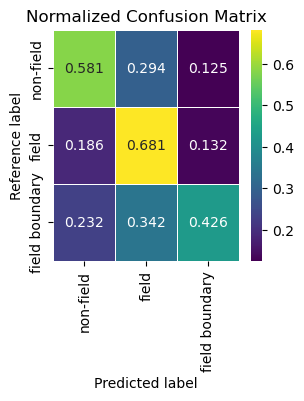

Train ▸ loss 0.6363 acc 0.658 | Val ▸ loss 0.6913 acc 0.612 | OA 0.612 mIoU 0.374
  ↳ early-stopping counter: 6/10

— Epoch 30/50 —


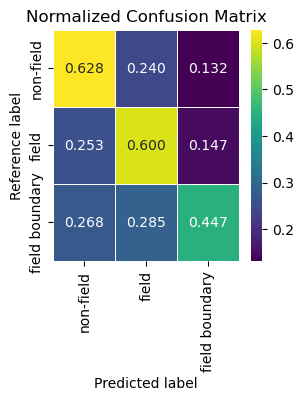

Train ▸ loss 0.6351 acc 0.660 | Val ▸ loss 0.6918 acc 0.604 | OA 0.604 mIoU 0.368
  ↳ early-stopping counter: 7/10

— Epoch 31/50 —


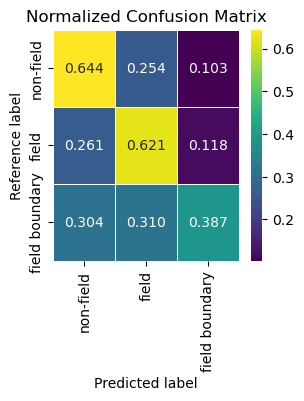

Train ▸ loss 0.6351 acc 0.660 | Val ▸ loss 0.6974 acc 0.617 | OA 0.617 mIoU 0.374
  ↳ early-stopping counter: 8/10

— Epoch 32/50 —


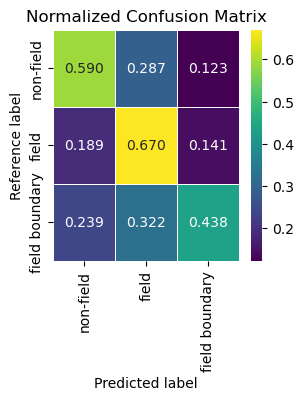

Train ▸ loss 0.6344 acc 0.661 | Val ▸ loss 0.6873 acc 0.613 | OA 0.613 mIoU 0.376
  ↳ new best model saved

— Epoch 33/50 —


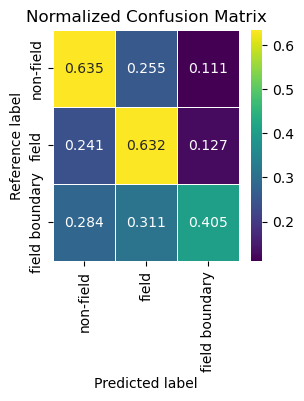

Train ▸ loss 0.6339 acc 0.661 | Val ▸ loss 0.6937 acc 0.618 | OA 0.618 mIoU 0.377
  ↳ early-stopping counter: 1/10

— Epoch 34/50 —


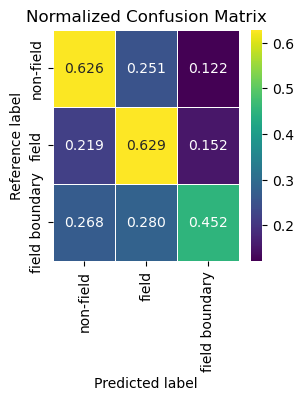

Train ▸ loss 0.6339 acc 0.661 | Val ▸ loss 0.6853 acc 0.616 | OA 0.616 mIoU 0.379
  ↳ new best model saved

— Epoch 35/50 —


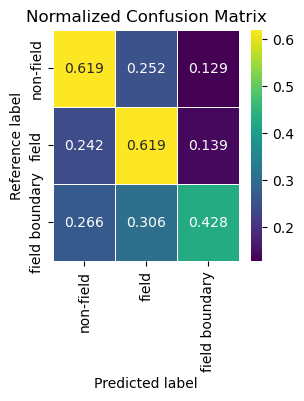

Train ▸ loss 0.6331 acc 0.662 | Val ▸ loss 0.6956 acc 0.606 | OA 0.606 mIoU 0.369
  ↳ early-stopping counter: 1/10

— Epoch 36/50 —


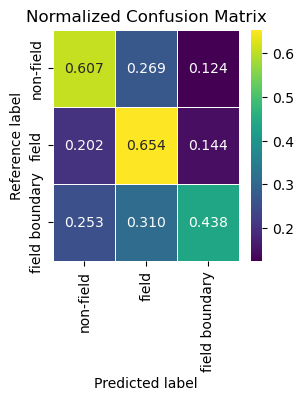

Train ▸ loss 0.6329 acc 0.663 | Val ▸ loss 0.6890 acc 0.615 | OA 0.615 mIoU 0.378
  ↳ early-stopping counter: 2/10

— Epoch 37/50 —


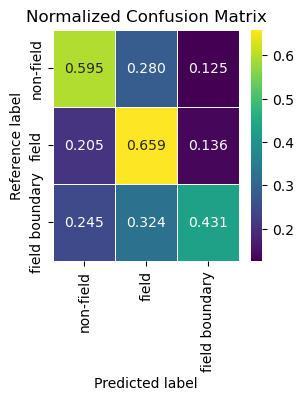

Train ▸ loss 0.6319 acc 0.664 | Val ▸ loss 0.6909 acc 0.610 | OA 0.610 mIoU 0.373
  ↳ early-stopping counter: 3/10

— Epoch 38/50 —


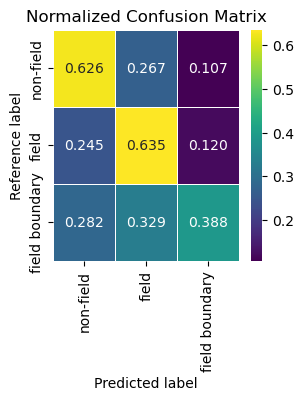

Train ▸ loss 0.6318 acc 0.664 | Val ▸ loss 0.6987 acc 0.614 | OA 0.614 mIoU 0.372
  ↳ early-stopping counter: 4/10

— Epoch 39/50 —


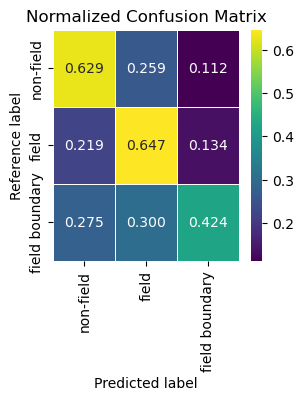

Train ▸ loss 0.6314 acc 0.664 | Val ▸ loss 0.6866 acc 0.623 | OA 0.623 mIoU 0.382
  ↳ early-stopping counter: 5/10

— Epoch 40/50 —


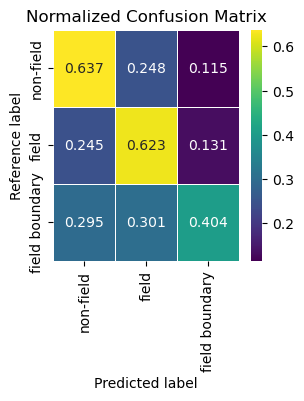

Train ▸ loss 0.6310 acc 0.665 | Val ▸ loss 0.6974 acc 0.616 | OA 0.616 mIoU 0.375
  ↳ early-stopping counter: 6/10

— Epoch 41/50 —


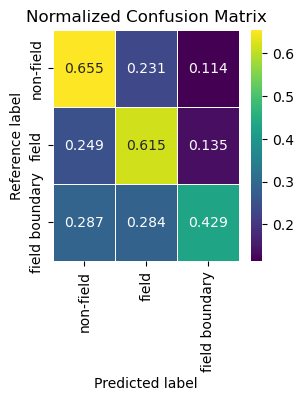

Train ▸ loss 0.6305 acc 0.666 | Val ▸ loss 0.6861 acc 0.624 | OA 0.624 mIoU 0.383
  ↳ early-stopping counter: 7/10

— Epoch 42/50 —


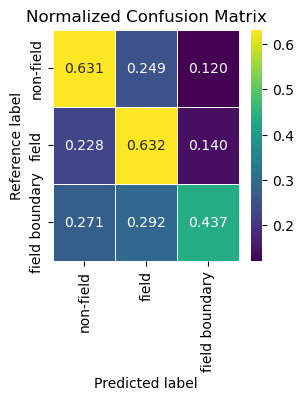

Train ▸ loss 0.6300 acc 0.666 | Val ▸ loss 0.6867 acc 0.618 | OA 0.618 mIoU 0.380
  ↳ early-stopping counter: 8/10

— Epoch 43/50 —


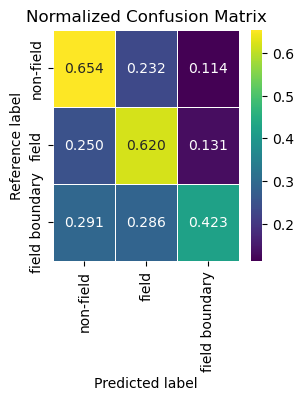

Train ▸ loss 0.6299 acc 0.667 | Val ▸ loss 0.6871 acc 0.625 | OA 0.625 mIoU 0.383
  ↳ early-stopping counter: 9/10

— Epoch 44/50 —


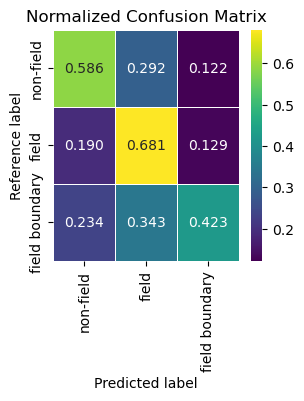

Train ▸ loss 0.6296 acc 0.667 | Val ▸ loss 0.6903 acc 0.614 | OA 0.614 mIoU 0.376
  ↳ early-stopping counter: 10/10
Early stopping triggered.
✓ training complete – metrics saved.


In [23]:
run_segmentation_lacuna(
    model            = model,
    train_dataloader = train_dataloader,
    val_dataloader   = val_dataloader,
    params_train     = params_train, 
    device           = device,
    checkpoint_root  = "model_out/exp_tversky_loss_finetune"
)


In [24]:
checkpoint_root  = "model_out/exp_tversky_loss_finetune"
checkpoint_path = os.path.join(checkpoint_root, "best_model.pth")
model.load_state_dict(torch.load(checkpoint_path, map_location=device))
model.to(device)
model.eval()

# ------------------------
# Load Test Data
# ------------------------
print("Loading test dataset...")
test_dataset = ImageData(
    data_path=params_train['data_path'],
    log_dir=params_train['log_dir'], 
    catalog=pd.read_csv(params_train['train_csv_name']).reset_index(drop=True),  
    data_size=params_train['data_size'],
    buffer=params_train['buffer'],
    buffer_comp=params_train['buffer_comp'],
    usage="test", 
    img_path_cols=params_train['img_path_cols'], 
    label_path_col=params_train['label_path_col'], 
    label_group=params_train['label_group'], 
    apply_normalization=params_train['apply_normalization'],
    normal_strategy=params_train['normal_strategy'],
    stat_procedure=params_train['stat_procedure'],
    global_stats=params_train['global_stats'],
    catalog_index=params_train['catalog_index'],
    trans=params_train['trans'],
    parallel=params_train['parallel'],
    scale_factor=params_train['scale_factor'],
    crop_strategy=params_train['crop_strategy'],
    rotation_degree=params_train['rotation_degree'],
    sigma_range=params_train['sigma_range'],
    br_range=params_train['br_range'],
    contrast_range=params_train['contrast_range'],
    bshift_gamma_range=params_train['bshift_gamma_range'],
    patch_shift=params_train['patch_shift'],
    downfactor=params_train['downfactor'],
    clip_val=params_train['clip_val'],
    nodata=params_train['nodata']
)

from torch.utils.data import DataLoader
test_dataloader = DataLoader(
    test_dataset,
    batch_size=params_train["validate_batch"],
    shuffle=False
)

Loading test dataset...
type: <class 'numpy.ndarray'> shape/len: (224, 224, 4)
----------6748 samples loaded in test dataset-----------
Total number of samples in test dataset: 6748


Running inference on test dataset...


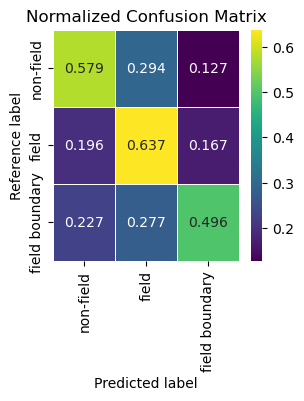


Test Metrics:
Overall Accuracy: 0.5925
Mean Accuracy: 0.5709
Mean IoU: 0.3449
Mean Precision: 0.4934
Mean Recall: 0.5709
Mean F1 Score: 0.4903


In [27]:
# Inference & Evaluation
print("Running inference on test dataset...")
class_mapping = params_train["class_mapping"]

metrics = evaluate_dataloader(
    model=model,
    dataloader=test_dataloader,
    num_classes=3,
    class_mapping=class_mapping,
    device=device,
    buffer=params_test.get('buffer', None),
    out_name=os.path.join(checkpoint_root, "test_metrics.csv")
)

# Print and save results
print("\nTest Metrics:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

metrics_df = pd.DataFrame([metrics])
os.makedirs(params_test.get(checkpoint_root, "./test_results"), exist_ok=True)
metrics_df.to_csv(os.path.join(checkpoint_root, "test_summary_metrics.csv"), index=False)

In [32]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(model, dataloader, class_mapping, device, num_images=4, save_dir=None, fname_prefix = "pred"):
    """
    Visualizes predictions alongside ground truth for a few samples.
    
    Args:
        model (nn.Module): Trained segmentation model.
        dataloader (DataLoader): Validation/test DataLoader.
        class_mapping (dict): Mapping of class indices to names.
        device (torch.device): CPU or CUDA.
        num_images (int): Number of samples to visualize.
    """

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
    
    model.eval()
    cmap = plt.get_cmap("tab10")  # for consistent color mapping
    with torch.no_grad():
        for batch in dataloader:
            images, labels = batch
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            for i in range(min(num_images, images.shape[0])):
                img = images[i].cpu().numpy()
                label = labels[i].cpu().numpy()
                pred = preds[i].cpu().numpy()

                # If image has 4 channels, use RGB only for visualization
                img_disp = img[:3, :, :] if img.shape[0] >= 3 else img
                img_disp = np.moveaxis(img_disp, 0, -1)  # CxHxW -> HxWxC
                img_disp = (img_disp - img_disp.min()) / (img_disp.max() - img_disp.min())

                fig, axes = plt.subplots(1, 3, figsize=(12, 4))
                axes[0].imshow(img_disp)
                axes[0].set_title("Input Image")
                axes[0].axis('off')

                axes[1].imshow(label, cmap="tab10", vmin=0, vmax=len(class_mapping)-1)
                axes[1].set_title("Ground Truth")
                axes[1].axis('off')

                axes[2].imshow(pred, cmap="tab10", vmin=0, vmax=len(class_mapping)-1)
                axes[2].set_title("Prediction")
                axes[2].axis('off')

                plt.tight_layout()
                plt.show()

                if save_dir is not None:
                    fname = f"{fname_prefix}_{i}.png"
                    fig_path = os.path.join(save_dir, fname)
                    fig.savefig(fig_path, dpi=300, bbox_inches="tight")
                    plt.close(fig)  # free memory
                    print(f"Saved → {fig_path}")

            break  # Only first batch


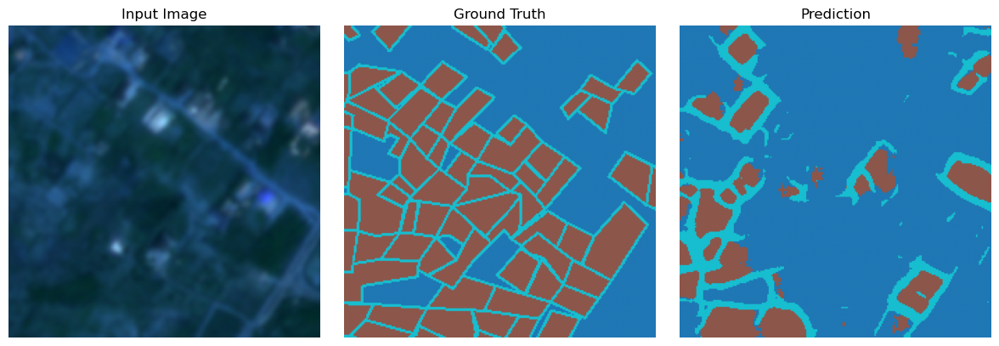

Saved → model_out/exp_tversky_loss_finetune/pred_0.png


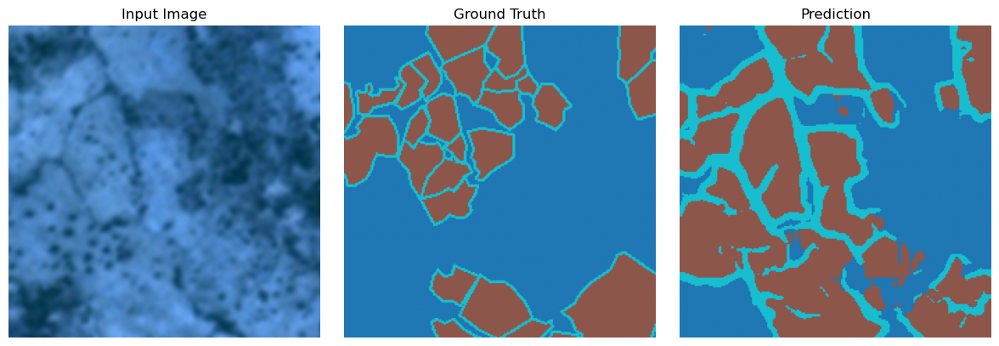

Saved → model_out/exp_tversky_loss_finetune/pred_1.png


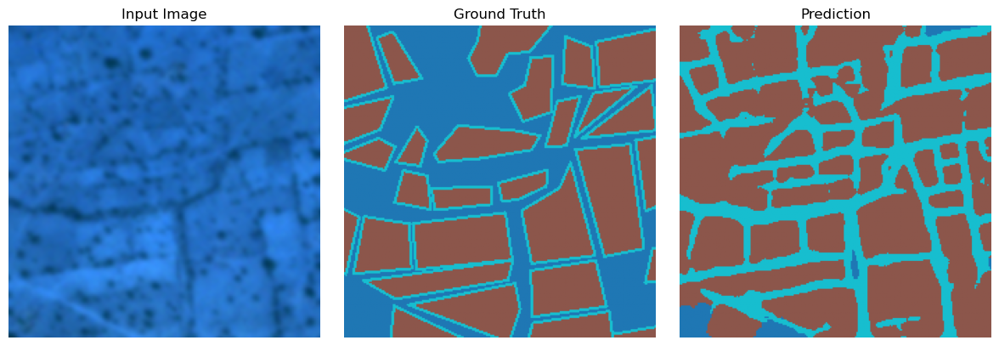

Saved → model_out/exp_tversky_loss_finetune/pred_2.png


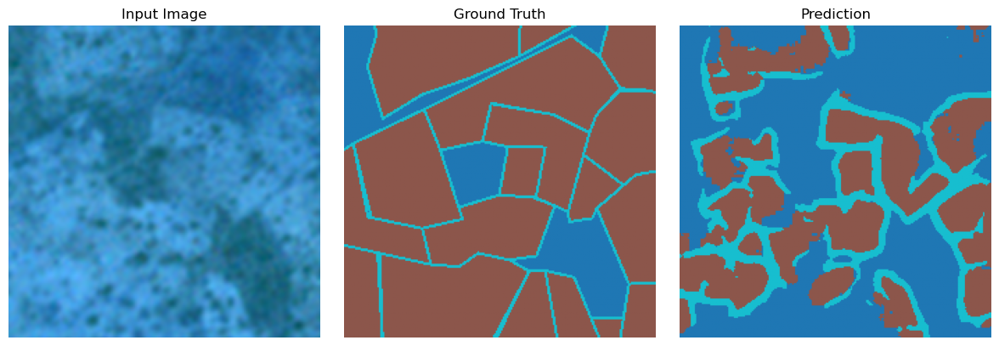

Saved → model_out/exp_tversky_loss_finetune/pred_3.png


In [30]:
class_mapping = params_train["class_mapping"]
visualize_predictions(
    model=model,
    dataloader=val_dataloader,
    class_mapping=class_mapping,
    device=device,
    num_images=4,
    save_dir=checkpoint_root
)